# Trabajo de final de máster de Big Data & Data Science de la Universidad de Barcelona

- Entrega: 4
- Fecha: 11/02/2022
- Autores: Mario Mérida, Jesus García Solsana, Eduerdo Farías Pedreros

---
# Identificar y localizar anomalías de COVID-19 en radiografías de tórax de la competencia de kaggle "[SIIM-FISABIO-RSNA COVID-19 Detection](https://www.kaggle.com/c/siim-covid19-detection)".

Cinco veces más letal que la gripe, el COVID-19 causa una morbilidad y mortalidad significativas. Al igual que otras neumonías, la infección pulmonar por COVID-19 produce inflamación y líquido en los pulmones. El COVID-19 se parece mucho a otras neumonías virales y bacterianas en las radiografías de tórax, lo que dificulta su diagnóstico. Su modelo de visión artificial para detectar y localizar la COVID-19 ayudaría a los médicos a proporcionar un diagnóstico rápido y fiable. Como resultado, los pacientes podrían recibir el tratamiento adecuado antes de que se produzcan los efectos más graves del virus.

Actualmente, COVID-19 se puede diagnosticar mediante la reacción en cadena de la polimerasa para detectar material genético del virus o una radiografía de tórax. Sin embargo, pueden pasar algunas horas y, a veces, días antes de que se obtengan los resultados de las pruebas moleculares. Por el contrario, las radiografías de tórax se pueden obtener en minutos. Si bien existen pautas para ayudar a los radiólogos a diferenciar el COVID-19 de otros tipos de infección, sus evaluaciones varían. Además, los no radiólogos podrían recibir apoyo con una mejor localización de la enfermedad, como con un cuadro delimitador visual.

Como organización de atención médica líder en su campo, la misión de la Society for Imaging Informatics in Medicine (SIIM) es promover la informática de imágenes médicas a través de la educación, la investigación y la innovación. SIIM se ha asociado con la Fundación para el Fomento de la Investigación Sanitaria y Biomédica de la Comunidad Valenciana (FISABIO), el Banco de Datos de Imagen Médica de la Comunidad Valenciana (BIMCV) y la Sociedad Radiológica de Norteamérica (RSNA) para este concurso.

En esta competencia, identificará y localizará anomalías de COVID-19 en radiografías de tórax. En particular, clasificará las radiografías como negativas para neumonía o típicas, indeterminadas o atípicas para COVID-19. Usted y su modelo trabajarán con datos de imágenes y anotaciones de un grupo de radiólogos.

Si tiene éxito, ayudará a los radiólogos a diagnosticar a los millones de pacientes con COVID-19 con mayor confianza y rapidez. Esto también permitirá a los médicos ver el alcance de la enfermedad y ayudarlos a tomar decisiones sobre el tratamiento. Dependiendo de la gravedad, los pacientes afectados pueden necesitar hospitalización, ingreso en una unidad de cuidados intensivos o terapias de apoyo como ventilación mecánica. Como resultado de un mejor diagnóstico, más pacientes recibirán rápidamente la mejor atención para su condición, lo que podría mitigar los efectos más severos del virus.

Esta es una competencia de código. Consulte [Requisitos del código](https://www.kaggle.com/c/siim-covid19-detection/overview/code-requirements) para obtener más información.

### Organizaciones anfitrionas

**FISABIO, Fundación para el Fomento de la Salud y la Investigación Biomédica de la Comunidad Valenciana**

La Fundación para el Fomento de la Investigación Biomédica y Sanitaria de la Comunitat Valenciana, FISABIO, es una entidad científica y asistencial sin ánimo de lucro, que tiene como finalidad principal el fomento, la promoción y el desarrollo de la investigación científico-técnica biomédica y sanitaria en la Comunitat Valenciana. FISABIO integra y gestiona el Mapa de Investigación Sanitaria del Centro de Investigación en Salud Pública, Fundación Hospital Universitario Dr. Peset, Fundación Hospital General Universitario de Alicante, Fundación Hospital General Universitario de Elche y Fundación Oftalmológica del Mediterráneo. La instalación de BIMCV está conectada con un archivo neutral de proveedores (VNA) de varios niveles. La instalación de imagen de población almacena datos de la Comunidad Valenciana, que cuenta con más de 5,1 millones de habitantes.

**Sociedad Radiológica de América del Norte (RSNA)**

La Sociedad Radiológica de América del Norte (RSNA) es una organización sin fines de lucro que representa a 31 subespecialidades radiológicas de 145 países de todo el mundo. RSNA promueve la excelencia en la atención al paciente y la prestación de atención médica a través de la educación, la investigación y la innovación tecnológica.

RSNA proporciona recursos educativos de alta calidad, publica cinco de las principales revistas revisadas por pares, organiza la conferencia de radiología más grande del mundo y se dedica a construir el futuro de la profesión a través de la Fundación RSNA Research & Education (R&E), que ha financiado $66 millones en subvenciones. desde su concepción. RSNA también apoya y facilita la investigación de inteligencia artificial (IA) en imágenes médicas mediante el patrocinio de una serie continua de concursos de desafíos de IA.

---
# Carga de librerias

In [7]:
# para tratamiento de datos
import numpy as np
import pandas as pd
import json
import os, shutil
import csv
import pickle


# para procesamiento de imagenes
import pydicom as dicom
import cv2
from PIL import Image
from skimage.metrics import structural_similarity as ssim
import re
import imageio
from imgaug import augmenters as iaa 
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage


# para gráficos
import matplotlib.pylab as plt

# para modelado
import tensorflow as tf
import torch

from tensorflow.keras import regularizers, optimizers
from sklearn import preprocessing, model_selection
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay, classification_report
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator, img_to_array
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense, BatchNormalization, Conv2D, MaxPooling2D  # para layers de modelo


import yaml

import wandb

from yolov5 import utils


---
# Análisis exploratorio


## Análisis de imágenes

### Exploración de imagen `dicom`

In [2]:
def show_dcm_file(return_file_meta,dir):
    
    """Función para ver imágen DCM y sus principales características.
    - return_file_meta: opción para que la función regrese la imagen y almacenarla en una variable.
    - dir: directorio de imagen/imágenes DCM a mostrar.""" 
    
    # lista auxiliar
    dcm_file_name = []
    dcm_list = []
    dcm_list_full_dir = []
    
    # obtenemos nombre de archivos y ruta
    for root, directories, files in os.walk(dir, topdown=False):
        for name in files:
            dcm_dir = os.path.join(root)
            dcm_file_name = os.path.join(name)

            # ruta completa a imagen DCM a mostrar
            dcm_full_dir = os.path.join(dcm_dir, dcm_file_name)

            # cargamos la imagen
            dcm = dicom.dcmread(dcm_full_dir)

            # muestra de resultados
            if return_file_meta == True:
                dcm_list_full_dir.append(dcm_full_dir)
                dcm_list.append(dicom.dcmread(dcm_full_dir))
            else:
                print('Ruta de imagen/imágenes:', dcm_dir)
                print('ID estudio:', dcm_file_name)
                print("Tipo de imagen:", type(dcm))
                print("Dimensiones de matrix de imagen:", img_to_array(dcm.pixel_array).shape)
                print('Sexo del paciente:', dcm[0x0010, 0x0040][:])
                plt.figure(figsize=(16,8))
                plt.imshow(dcm.pixel_array)
                plt.show()
                print('---------------------------------------------------------------')
                
    if not dcm_list == []:
        return dcm_list_full_dir, dcm_list

Ruta de imagen/imágenes: ./data/train/00f9e183938e/081e92373dc6
ID estudio: 6534a837497d.dcm
Tipo de imagen: <class 'pydicom.dataset.FileDataset'>
Dimensiones de matrix de imagen: (2544, 3056, 1)
Sexo del paciente: F


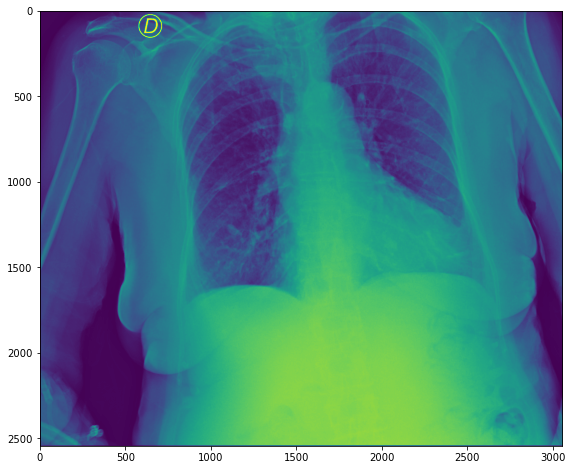

---------------------------------------------------------------
Ruta de imagen/imágenes: ./data/train/00f9e183938e/89bad86310f9
ID estudio: 74077a8e3b7c.dcm
Tipo de imagen: <class 'pydicom.dataset.FileDataset'>
Dimensiones de matrix de imagen: (2544, 3056, 1)
Sexo del paciente: F


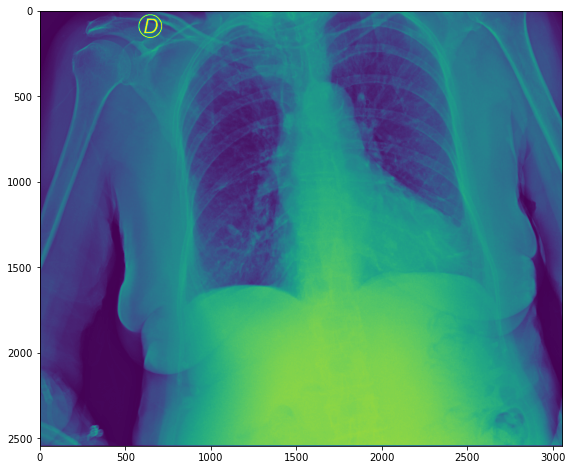

---------------------------------------------------------------


In [3]:
# mostramos imagen/imágenes DCM
show_dcm_file(return_file_meta=False,
                dir = './data/train/00f9e183938e/')

In [4]:
# ejemplo para obtener un metadato específico de imagen DCM
show_dcm_file(return_file_meta=True,
                dir = './data/train/00f9e183938e/')[1][0][0x7fe0, 0x0010]

(7fe0, 0010) Pixel Data                          OW: Array of 15548928 elements

### Conversion de `dcm` a `jpg`

In [5]:
def conv_dcm_to_jpg(input_dir,
                    output_dir = './data/examples/train_jpg/',
                    return_jpg = True):

    """Función para ver convertir archivos DCM de un directorio (inc. subdirectorios) a JPG.
    - input_dir: directorio de archivos DCM a covertir.
    - output_dir: directorio de archivos JPG.
    - return_jpg: opción para que la función regrese la imagen y almacenarla en una variable.""" 
    
    # lista de archivos DCM en el directorio input
    dcm_list = show_dcm_file(return_file_meta = True,
                                    dir = input_dir)[1]
    
    for dcm in dcm_list:
        # matriz de pixeles de imagen DCM
        dcm_pixel_array_numpy = dcm.pixel_array
        
        # normalizado de escala de imagen (de int16 a uint8)
        scaled_img = cv2.convertScaleAbs(dcm_pixel_array_numpy-np.min(dcm_pixel_array_numpy), alpha=(255.0 / min(np.max(dcm_pixel_array_numpy)-np.min(dcm_pixel_array_numpy), 10000)))

        # definimos ubicacion de archivo JPG y creamos carpeta si no existe
        if not os.path.exists(output_dir):
            os.makedirs(output_dir)

        # remplazo extenision DCM a JPG
        jpg_file_name = dcm[0x0008, 0x0018][:]+'.jpg'

        # direccion completa a imagen JPG a convertir
        jpg_full_dir = os.path.join(output_dir, jpg_file_name)

        # creamos archivo JPG en directorio dado
        result = cv2.imwrite(jpg_full_dir, scaled_img)

        # mostramos resultados    
        if result == True:
            jpg = load_img(jpg_full_dir)
            if return_jpg == True:    
                print('Imagen convertida correctamente.')
                print('Ruta de imagen/imágenes DCM:', input_dir)
                print('Ruta de imagen/imágenes JPG:', output_dir)
                print('ID estudio:', jpg_file_name)
                print("Tipo de imagen:", type(jpg))
                print("Modo de imagen:", jpg.mode)
                print("Tamaño de imagen:", jpg.size)
                print("Dimensiones de matrix de imagen:", img_to_array(jpg).shape)
                plt.figure(figsize=(16,8))
                plt.imshow(jpg)
                plt.show()
                print('---------------------------------------------------------------')
        else:
            print('Error in saving file')

Imagen convertida correctamente.
Ruta de imagen/imágenes DCM: ./data/train/00f9e183938e/
Ruta de imagen/imágenes JPG: ./data/examples/train_jpg/
ID estudio: 6534a837497d.jpg
Tipo de imagen: <class 'PIL.Image.Image'>
Modo de imagen: RGB
Tamaño de imagen: (3056, 2544)
Dimensiones de matrix de imagen: (2544, 3056, 3)


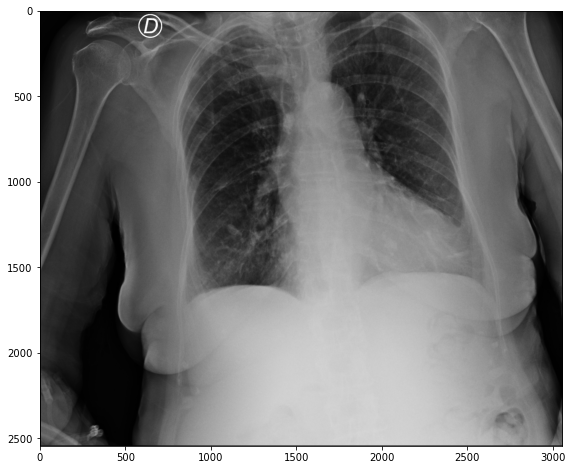

---------------------------------------------------------------
Imagen convertida correctamente.
Ruta de imagen/imágenes DCM: ./data/train/00f9e183938e/
Ruta de imagen/imágenes JPG: ./data/examples/train_jpg/
ID estudio: 74077a8e3b7c.jpg
Tipo de imagen: <class 'PIL.Image.Image'>
Modo de imagen: RGB
Tamaño de imagen: (3056, 2544)
Dimensiones de matrix de imagen: (2544, 3056, 3)


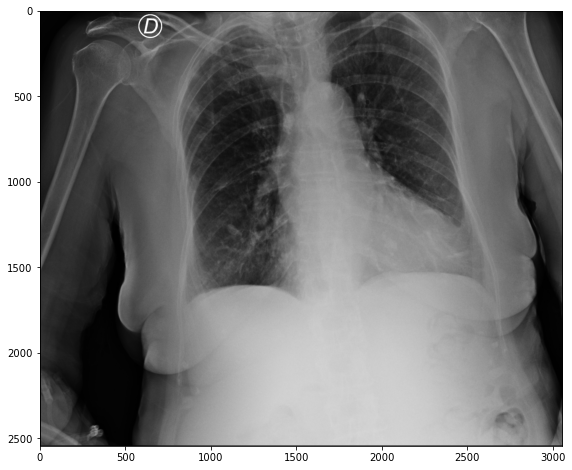

---------------------------------------------------------------


In [6]:
# conversión de imagen/imágenes DCM a JPG
conv_dcm_to_jpg(input_dir = './data/train/00f9e183938e/',
                output_dir = './data/examples/train_jpg/',
                return_jpg=True)

In [7]:
# conversión de imagen/imágenes DCM a JPG
conv_dcm_to_jpg(input_dir = './data/train/00086460a852/',
                output_dir = './data/examples/train_jpg/',
                return_jpg=False)

### Transformación de imagen `jpg` a escala de grises y tamaño reducido

In [8]:
def reduce_jpg(dir,
                jpg_file_name,
                output_basewidth = 450,
                output_subfix = '_red',
                return_jpg_red = True):
    
    """Función para ver reducir tamaño de imagen JPG y convertir a escala de grises.
    - dir: directorio de imagen original a reducir.
    - jpg_file_name: nombre de archivo JPG original a reducir.
    - output_basewidth: ancho de la imagen reducida en pixeles.
    - output_subfix: subfijo para identificar jpg reducido.
    - return_jpg_red: retorna imagen reducida.""" 

    # definimos la ruta completa de imagen original
    jpg_full_dir = dir+jpg_file_name

    #abrimos la imagen oringial y la pasamos a escala de grises
    jpg = Image.open(jpg_full_dir).convert('RGB')    
    jpg_red = Image.open(jpg_full_dir).convert('L')

    # calculamos relacion entre imagen original y nueva imagen
    wpercent = (output_basewidth / float(jpg.size[0]))

    #ajustamos el alto de la imagen
    hsize = int((float(jpg.size[1]) * float(wpercent)))

    # cambiamos el tamaño de la imagen en base al ancho dado y alto calculado
    jpg_red = jpg_red.resize((output_basewidth, hsize), Image.ANTIALIAS)

    # agergamos subfijo para identificar reduccion de calidad
    jpg_red_full_dir = jpg_full_dir.replace('.jpg', output_subfix+'.jpg')

    # guardamos la imagen
    jpg_red.save(jpg_red_full_dir)

    # mostramos resultados
    print('Imagen reducida correctamente.')
    if return_jpg_red == True:  
        print('Ruta de imagen/imágenes original:', jpg_full_dir)
        print('Ruta de imagen/imágenes reducida:', jpg_red_full_dir)
        print('ID estudio original:', jpg_file_name)
        print("Tipo de imagen original:", type(jpg))
        print("Tipo de imagen reducida:", type(jpg_red))
        print("Modo de imagen original:", jpg.mode)
        print("Modo de imagen reducida:", jpg_red.mode)
        print("Tamaño de imagen original:", jpg.size)
        print("Tamaño de imagen reducida:", jpg_red.size)
        print("Dimensiones de matrix de imagen original:", img_to_array(jpg).shape)
        print("Dimensiones de matrix de imagen reducida:", img_to_array(jpg_red).shape)
        plt.figure(figsize=(16,8))
        plt.imshow(jpg_red, cmap='gray')
        plt.show()
        print('---------------------------------------------------------------')

Imagen reducida correctamente.
Ruta de imagen/imágenes original: ./data/examples/train_jpg/6534a837497d.jpg
Ruta de imagen/imágenes reducida: ./data/examples/train_jpg/6534a837497d_red.jpg
ID estudio original: 6534a837497d.jpg
Tipo de imagen original: <class 'PIL.Image.Image'>
Tipo de imagen reducida: <class 'PIL.Image.Image'>
Modo de imagen original: RGB
Modo de imagen reducida: L
Tamaño de imagen original: (3056, 2544)
Tamaño de imagen reducida: (450, 374)
Dimensiones de matrix de imagen original: (2544, 3056, 3)
Dimensiones de matrix de imagen reducida: (374, 450, 1)


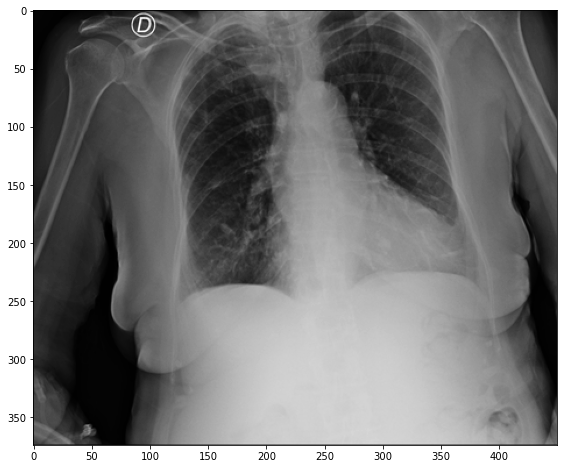

---------------------------------------------------------------


In [9]:
# reducimos una imagen JPG y pasamos a escala de grises
reduce_jpg(dir = './data/examples/train_jpg/',
                jpg_file_name = '6534a837497d.jpg',
                output_basewidth = 450,
                output_subfix = '_red',
                return_jpg_red = True)

In [10]:
# reducimos una imagen JPG y pasamos a escala de grises
reduce_jpg(dir = './data/examples/train_jpg/',
                jpg_file_name = '65761e66de9f.jpg',
                output_basewidth = 450,
                output_subfix = '_red',
                return_jpg_red = False)

Imagen reducida correctamente.


In [11]:
# reducimos una imagen JPG y pasamos a escala de grises
reduce_jpg(dir = './data/examples/train_jpg/',
                jpg_file_name = '74077a8e3b7c.jpg',
                output_basewidth = 450,
                output_subfix = '_red',
                return_jpg_red = False)

Imagen reducida correctamente.


### Conclusion de imágenes

Por medio de la librería `pydicom`, las imágenes pueden leerse directamente como fueron obtenidas de la fuente en formato `DCM` en Python. Sin embargo la resolución de las imágenes y la gama de colores pueden tener un coste computacional considerable al momento de analizar grandes volúmenes de datos.

Se deberá entonces convertir el formato de la imágen a un formato más simple de interpretar, como por ejemplo en `JPG`, donde se observa que la gama de colores se reduce naturalmente a escala de grises. Esto tiene sentido ya que las radiografías suelen estar en una gama de colores entre azul y negro. También analizamos la posibilidad de escalar la imágen para reducir el coste computacional a expensas de la precisión de un modelo.

---
## Análisis de dataframes

### Dataframe `train_study_level.csv`

In [12]:
# directorio de datos de entrenamiento
train_dir = "./data/train/"

# cargamos datos de estudio
df_study = pd.read_csv('./train_study_level.csv')

# limpiamos datos a relacionar
df_study['study_dir'] = df_study['id'].str.replace('_study','')

# quitamos columnas redundantes
df_study = df_study.drop(columns = ['id'])

# muestra resultados
df_study[:5]

,Negative for Pneumonia,Typical Appearance,Indeterminate Appearance,Atypical Appearance,study_dir
0,0,1,0,0,00086460a852
1,0,0,0,1,000c9c05fd14
2,1,0,0,0,00292f8c37bd
3,1,0,0,0,005057b3f880
4,0,0,0,1,0051d9b12e72


### Dataframe `train_image_level.csv`

In [13]:
# cargamos datos de imagenes
df_image = pd.read_csv('./train_image_level.csv')

#limpiamos los datos
df_image["image_name"] = df_image["id"].str.replace('_image', '')

#quitamos datos redundantes
df_image = df_image.drop(columns = {'id'})

# muestra resultados
df_image[:5]

,boxes,label,StudyInstanceUID,image_name
0,"[{'x': 789.28836, 'y': 582.43035, 'width': 102...",opacity 1 789.28836 582.43035 1815.94498 2499....,5776db0cec75,000a312787f2
1,NaN,none 1 0 0 1 1,ff0879eb20ed,000c3a3f293f
2,"[{'x': 677.42216, 'y': 197.97662, 'width': 867...",opacity 1 677.42216 197.97662 1545.21983 1197....,9d514ce429a7,0012ff7358bc
3,"[{'x': 2729, 'y': 2181.33331, 'width': 948.000...",opacity 1 2729 2181.33331 3677.00012 2785.33331,28dddc8559b2,001398f4ff4f
4,"[{'x': 623.23328, 'y': 1050, 'width': 714, 'he...",opacity 1 623.23328 1050 1337.23328 2156 opaci...,dfd9fdd85a3e,001bd15d1891


### Dataframe de contentido en `carpeta train`

In [14]:
# creacion de lista auxiliar
train_walk_list = []

# carga de datos de carpetas, subcarpetas y archivos de un dado directorio
for root, directories, files in os.walk(train_dir, topdown=False):
	for name in files:
		train_walk_list.append(os.path.join(root, name))

# creacion de un dataframe con los datos obtenidos
df = pd.DataFrame(train_walk_list)

# separacion de datos en columnas
df[0] = df[0].str.replace('\\', '/', regex=True)
df[['data','root','train_dir', 'study_dir','study_subdir', 'image_name']] = df[0].str.split('/', expand=True)
df[['image_name', 'ext']] = df['image_name'].str.split('.',expand=True)
df['full_dir'] = df[0]

# quitamos columnas redundantes
df = df.drop(columns = [0, 'data', 'root', 'train_dir', 'ext'])

# mostrar resultados
df[:5]

,study_dir,study_subdir,image_name,full_dir
0,00086460a852,9e8302230c91,65761e66de9f,./data/train/00086460a852/9e8302230c91/65761e6...
1,000c9c05fd14,e555410bd2cd,51759b5579bc,./data/train/000c9c05fd14/e555410bd2cd/51759b5...
2,00292f8c37bd,73120b4a13cb,f6293b1c49e2,./data/train/00292f8c37bd/73120b4a13cb/f6293b1...
3,005057b3f880,e34afce999c5,3019399c31f4,./data/train/005057b3f880/e34afce999c5/3019399...
4,0051d9b12e72,152f6ec68d86,bb4b1da810f3,./data/train/0051d9b12e72/152f6ec68d86/bb4b1da...


### Union de dataframe de `carpeta train` con `train_study_level.csv` y `train_image_level.csv`.

In [15]:
# union con train_study
df = df.merge(right = df_study, how = 'left')

# union con train_image
df = df.merge(right = df_image, how = 'left')

# muestra de resultados
df[:5]

,study_dir,study_subdir,image_name,full_dir,Negative for Pneumonia,Typical Appearance,Indeterminate Appearance,Atypical Appearance,boxes,label,StudyInstanceUID
0,00086460a852,9e8302230c91,65761e66de9f,./data/train/00086460a852/9e8302230c91/65761e6...,0,1,0,0,"[{'x': 720.65215, 'y': 636.51048, 'width': 332...",opacity 1 720.65215 636.51048 1052.84563 1284....,00086460a852
1,000c9c05fd14,e555410bd2cd,51759b5579bc,./data/train/000c9c05fd14/e555410bd2cd/51759b5...,0,0,0,1,NaN,none 1 0 0 1 1,000c9c05fd14
2,00292f8c37bd,73120b4a13cb,f6293b1c49e2,./data/train/00292f8c37bd/73120b4a13cb/f6293b1...,1,0,0,0,NaN,none 1 0 0 1 1,00292f8c37bd
3,005057b3f880,e34afce999c5,3019399c31f4,./data/train/005057b3f880/e34afce999c5/3019399...,1,0,0,0,NaN,none 1 0 0 1 1,005057b3f880
4,0051d9b12e72,152f6ec68d86,bb4b1da810f3,./data/train/0051d9b12e72/152f6ec68d86/bb4b1da...,0,0,0,1,"[{'x': 812.54698, 'y': 1376.41291, 'width': 62...",opacity 1 812.54698 1376.41291 1435.14793 1806...,0051d9b12e72


### Clases de diagnostico

In [16]:
# creamos función de clasificación
def label_diag(row):
   
   """Funcion para clasificar las columnas de diagnóstico en una sóla columna (datos de formato wide a long)."""
   
   if row['Negative for Pneumonia'] == 1 :
      return 'neg_for_pneumonia'
   if row['Typical Appearance'] == 1 :
      return 'typical'
   if row['Indeterminate Appearance'] == 1 :
      return 'indeterminate'
   if row['Atypical Appearance'] == 1 :
      return 'atypical'
   return 'Other'

In [17]:
# pasamos datos wide a long
df['diagnostic_cat'] = df.apply (lambda row: label_diag(row), axis=1)

#quitamos datos redundantes
df = df.drop(columns=['study_subdir', 'Negative for Pneumonia', 'Typical Appearance', 'Indeterminate Appearance', 'Atypical Appearance'])

# mostramos resultados
df[:5]

,study_dir,image_name,full_dir,boxes,label,StudyInstanceUID,diagnostic_cat
0,00086460a852,65761e66de9f,./data/train/00086460a852/9e8302230c91/65761e6...,"[{'x': 720.65215, 'y': 636.51048, 'width': 332...",opacity 1 720.65215 636.51048 1052.84563 1284....,00086460a852,typical
1,000c9c05fd14,51759b5579bc,./data/train/000c9c05fd14/e555410bd2cd/51759b5...,NaN,none 1 0 0 1 1,000c9c05fd14,atypical
2,00292f8c37bd,f6293b1c49e2,./data/train/00292f8c37bd/73120b4a13cb/f6293b1...,NaN,none 1 0 0 1 1,00292f8c37bd,neg_for_pneumonia
3,005057b3f880,3019399c31f4,./data/train/005057b3f880/e34afce999c5/3019399...,NaN,none 1 0 0 1 1,005057b3f880,neg_for_pneumonia
4,0051d9b12e72,bb4b1da810f3,./data/train/0051d9b12e72/152f6ec68d86/bb4b1da...,"[{'x': 812.54698, 'y': 1376.41291, 'width': 62...",opacity 1 812.54698 1376.41291 1435.14793 1806...,0051d9b12e72,atypical


In [18]:
# frecuencias absolutas de diagnósticos
df[['diagnostic_cat']].value_counts(normalize=True).round(3) * 100

diagnostic_cat   
typical              47.5
neg_for_pneumonia    27.4
indeterminate        17.5
atypical              7.6
dtype: float64

In [19]:
# resumen información del fichero
df.drop(columns=['full_dir']).describe(include='all')

,study_dir,image_name,boxes,label,StudyInstanceUID,diagnostic_cat
count,6334,6334,4294,6334,6334,6334
unique,6054,6334,4294,4295,6054,4
top,0fd2db233deb,65761e66de9f,"[{'x': 720.65215, 'y': 636.51048, 'width': 332...",none 1 0 0 1 1,0fd2db233deb,typical
freq,9,1,1,2040,9,3007


### Conclusion de dataframes

Al analizar los datos dados en los `CSV` y al compararlos con todos los archivos y subcarpetas dentro de la carpeta `train` se observa que hay carpetas `study_dir` que se repiten (`unique` es menor a `count`). Es decir que hay pacientes (`study_dir`) que tienen más de 1 estudio/radiografía (`image_name_jpg`).

Los estudios (`image_name_jpg`) tienen todos nombres distintos pero quizás hayan datos duplicados o en blanco. Esto solo se puede corroborar visualizando la imágen.

La cantidad de datos están distribuidos de la forma esperada no equitativa que es: mayor cantidad de estudios/radiografías con diagnóstico `típico`, luego casos `negativos para neumonía`, en tercer lugar casos `indeterminados` y finalmente, en menor proporción, casos `atípicos`.

---
## Análisis simultaneo de imágenes y dataframes

### Parseo de `boxes`(lista de diccionarios) y `labels`(str) a `dataframe`

In [20]:
# creamos función para agregar extensión a nombre de archivo
def append_ext(fn):
    
    """Función para agregar extension JPG a los valores en una columna de un dataframe."""
    
    return fn+".jpg"

In [21]:
# agregamos extension en image_name
df["image_name_jpg"]=df['image_name'].apply(append_ext)

#quitamos datos redundantes
df = df.drop(columns=['image_name'])

# mostramos resultados
df[:5]

,study_dir,full_dir,boxes,label,StudyInstanceUID,diagnostic_cat,image_name_jpg
0,00086460a852,./data/train/00086460a852/9e8302230c91/65761e6...,"[{'x': 720.65215, 'y': 636.51048, 'width': 332...",opacity 1 720.65215 636.51048 1052.84563 1284....,00086460a852,typical,65761e66de9f.jpg
1,000c9c05fd14,./data/train/000c9c05fd14/e555410bd2cd/51759b5...,NaN,none 1 0 0 1 1,000c9c05fd14,atypical,51759b5579bc.jpg
2,00292f8c37bd,./data/train/00292f8c37bd/73120b4a13cb/f6293b1...,NaN,none 1 0 0 1 1,00292f8c37bd,neg_for_pneumonia,f6293b1c49e2.jpg
3,005057b3f880,./data/train/005057b3f880/e34afce999c5/3019399...,NaN,none 1 0 0 1 1,005057b3f880,neg_for_pneumonia,3019399c31f4.jpg
4,0051d9b12e72,./data/train/0051d9b12e72/152f6ec68d86/bb4b1da...,"[{'x': 812.54698, 'y': 1376.41291, 'width': 62...",opacity 1 812.54698 1376.41291 1435.14793 1806...,0051d9b12e72,atypical,bb4b1da810f3.jpg


In [22]:
df_boxes = pd.DataFrame(df.loc[df['image_name_jpg'] == '65761e66de9f.jpg', 'boxes':'diagnostic_cat'].copy())

df_boxes

,boxes,label,StudyInstanceUID,diagnostic_cat
0,"[{'x': 720.65215, 'y': 636.51048, 'width': 332...",opacity 1 720.65215 636.51048 1052.84563 1284....,00086460a852,typical


In [23]:
df_boxes

,boxes,label,StudyInstanceUID,diagnostic_cat
0,"[{'x': 720.65215, 'y': 636.51048, 'width': 332...",opacity 1 720.65215 636.51048 1052.84563 1284....,00086460a852,typical


In [24]:
def vis_diag_box(jpg_file):
    
    """Función para parsear y visualizar diagnósticos de un estudio en un dataframe.

    Args:
        jpg_file: es el ID del estudio con extensión en JPG.

    Returns:
        dataframe: dataframe de boxes con diagnósticos.
    """
    
    # copiamos los datos del estudio a un dataframe
    df_boxes = pd.DataFrame(df.loc[df['image_name_jpg'] == jpg_file, 'boxes':'diagnostic_cat'].copy())
    
    # parseo de datos str a diccionario
    if "none" in str(df_boxes['label']):
        df_boxes['image_name_jpg'] = jpg_file
        df_boxes = df_boxes.reset_index(drop = True)
        df_boxes['box'] = pd.NA
        df_boxes['label_diagnostic'] = 'none'
        df_boxes['label_diagnostic_prob'] = 1
        df_boxes.drop(columns = ['boxes', 'label', 'StudyInstanceUID', 'diagnostic_cat'], inplace = True)
        return df_boxes
    else:
        df_boxes['boxes'] = df_boxes['boxes'].apply(eval)
        # transformacion de las listas a filas en el dataframe
        df_boxes = df_boxes.explode('boxes').reset_index(drop = True)
        # creamos columnas para almacenar datos
        df_boxes['image_name_jpg'] = jpg_file
        df_boxes['box'] = None
        df_boxes['x'] = None
        df_boxes['y'] = None
        df_boxes['width'] = None
        df_boxes['height'] = None
        df_boxes['label_diagnostic'] = None
        df_boxes['label_diagnostic_prob'] = None
        # copiamos datos de estudio a nuevas columnas
        for i in range(len(df_boxes)):
            df_boxes.loc[i, 'box'] = i
            df_boxes.loc[i, 'x'] = df_boxes.loc[i, 'boxes']['x']
            df_boxes.loc[i, 'y'] = df_boxes.loc[i, 'boxes']['y']
            df_boxes.loc[i, 'width'] = df_boxes.loc[i, 'boxes']['width']
            df_boxes.loc[i, 'height'] = df_boxes.loc[i, 'boxes']['height']
            df_boxes.loc[i, 'label_diagnostic'] = df_boxes.loc[i, 'diagnostic_cat']
            df_boxes.loc[i, 'label_diagnostic_prob'] = pd.Series(df_boxes.loc[0, 'label']).str.split(' ', 0, expand=True).loc()[0,i+1+5*i]
        # quitamos columnas no necesarias
        df_boxes.drop(columns = ['boxes', 'label', 'StudyInstanceUID', 'diagnostic_cat'], inplace = True)
        # transformamos las columnas a numerico
        for column in df_boxes:
            if column != 'image_name_jpg' and column != 'label_diagnostic': 
                df_boxes[column] = df_boxes[column].astype(float)
        # muestra resultados
        return df_boxes

In [25]:
# mostramos diagnósticos por recuadro de un estudio específico
vis_diag_box(jpg_file = '65761e66de9f.jpg')

,image_name_jpg,box,x,y,width,height,label_diagnostic,label_diagnostic_prob
0,65761e66de9f.jpg,0.0,720.65215,636.51048,332.19348,648.12561,typical,1.0
1,65761e66de9f.jpg,1.0,2044.77989,847.90622,329.87049,576.11169,typical,1.0


In [26]:
# mostramos diagnósticos por recuadro de un estudio específico
vis_diag_box(jpg_file = '6534a837497d.jpg')

,image_name_jpg,box,label_diagnostic,label_diagnostic_prob
0,6534a837497d.jpg,<NA>,none,1


In [27]:
# mostramos diagnósticos por recuadro de un estudio específico
vis_diag_box(jpg_file = '74077a8e3b7c.jpg')

,image_name_jpg,box,x,y,width,height,label_diagnostic,label_diagnostic_prob
0,74077a8e3b7c.jpg,0.0,2175.24285,1123.72368,432.26318,500.11853,atypical,1.0
1,74077a8e3b7c.jpg,1.0,823.16390,1324.77631,306.60522,394.56580,atypical,1.0
2,74077a8e3b7c.jpg,2.0,845.78232,291.86842,201.05261,437.28949,atypical,1.0


### Abrir imagen `jpg` en escala de grises y reducida con diagnostico en recuadro

In [28]:
# creamos función para abrir/ver imágenes JPG
def open_jpgs(jpg_file_name,
                red_jpg_file_name,
                dir = './data/examples/train_jpg/'):
    
    """Función para abrir 2 rutas e imágenes JPGs (original y reducida respectivamente).
    - jpg_file_name: nombre de imagen de estudio original.
    - red_jpg_file_name: nombre de imagen de estudio reducida.
    - dir: directorio con ubicación de archivos JPG original y reducio a abrir."""

    # definimos la ruta completa de imágen original y reducida
    jpg_full_dir = dir+jpg_file_name    
    red_jpg_full_dir = dir+red_jpg_file_name

    #abrimos la imagen oringial y la pasamos a escala de grises
    jpg = Image.open(jpg_full_dir).convert('RGB')   
    jpg_red = Image.open(red_jpg_full_dir).convert('L')

    return jpg_full_dir, jpg, red_jpg_full_dir, jpg_red


In [29]:
# creamos función para ver dataframes con datos de recuadros de diagnósticos
def vis_diag_jpg(file_name,
                    scale,
                    red_subfix = '_red',
                    dir = './data/examples/train_jpg/'):
    
    """Función para visualizar imagen con recuadros con diagnóstico en imágen JPG reducida.
    - file_name: nombre de archivo JPG al que se le agregarán los recuadros con diagnósticos.
    - scale: porcentaje de escalado entre imagen reducida sobre imagen original.
    - dir: directorio donde se encuentra el archivo JPG.""" 
    
    # verificamos nombre de archivo JPG original o reducido
    if red_subfix not in file_name:
        original = True
        jpg_file_name = file_name
        red_jpg_file_name = file_name.replace('.jpg', red_subfix+'.jpg')
    
    else:
        original = False
        jpg_file_name = file_name.replace(red_subfix,'')
        red_jpg_file_name = file_name
        
    # creación ded dataframe de boxes
    df_boxes = vis_diag_box(jpg_file_name)
    
    if df_boxes['label_diagnostic'][0] == 'none':
        print('Ruta de imagen:', dir)
        print('ID estudio:', file_name)
        print('Este estudio no tiene recuadros de diagnóstico.')
        plt.figure(figsize=(16,8))
        plt.imshow(Image.open(dir+file_name).convert('L'), cmap='gray')
        plt.show()
        print('---------------------------------------------------------------')
        return
    else:
        
        # bucle para cargar todos los recuadros    
        for box in range(len(df_boxes)):

            if original == True:
                # cargamos la imagen original
                img = cv2.imread(dir+jpg_file_name)
                scale = 1
                thickness = 3

            else:
                # cargamos la imagen REDUCIDA
                img = cv2.imread(dir+red_jpg_file_name)
                thickness = 1
            
            # cargamos las coordenadas de la esquina SUPERIOR IZQUIERDA del recuadro
            x1 = int(df_boxes.loc[df_boxes["image_name_jpg"] == jpg_file_name, 'x'][box] * scale)
            y1 = int(df_boxes.loc[df_boxes["image_name_jpg"] == jpg_file_name, 'y'][box] * scale)
            
            # cargamos dimensiones del recuadro
            w = int((df_boxes.loc[df_boxes["image_name_jpg"] == jpg_file_name, 'width'][box]) * scale)
            h = int((df_boxes.loc[df_boxes["image_name_jpg"] == jpg_file_name, 'height'][box]) * scale)
            
            # dibujamos un rectangulo
            img = cv2.rectangle(img = img, pt1 = (x1, y1), pt2 = (x1+w, y1+h), color = (0, 0, 255), thickness = thickness)
            print(f"Box {box}: x, y, w, h: {x1}, {y1}, {w}, {h}")
            
            # texto a incluir
            font                   = cv2.FONT_HERSHEY_SIMPLEX
            fontColor              = (0,0,255)
            if original == True:
                bottomLeftCornerOfText = (x1,y1-50)
                fontScale              = 3
                lineType               = 3
            else:
                bottomLeftCornerOfText = (x1,y1-10)
                fontScale              = 0.6
                lineType               = 1
            img_text = df_boxes.loc[df_boxes["image_name_jpg"] == jpg_file_name, 'label_diagnostic'][box]
            cv2.putText(img, img_text, bottomLeftCornerOfText, font, fontScale, fontColor, lineType)

            # guardamos la imagen
            if original == True:
                img_dir = dir+jpg_file_name
            else:
                img_dir = dir+red_jpg_file_name
        
            # guardamos la imagen
            cv2.imwrite(img_dir, img)
        
        # mostramos la imagen jpg
        print('Tamaño de imagen:', img.shape)
        if original == True:
            print("JPG original modificado.")
        else:
            print("JPG reducido modificado.")
        print('Ruta de imagen:', dir)
        print('ID estudio:', file_name)
        return load_img(dir+file_name)

Ruta de imagen: ./data/examples/train_jpg/
ID estudio: 6534a837497d_red.jpg
Este estudio no tiene recuadros de diagnóstico.


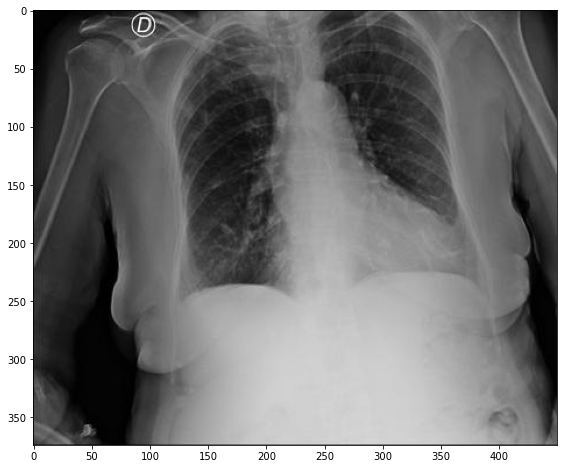

---------------------------------------------------------------


In [30]:
# datos de estudio a analizar

jpg_file_name = '6534a837497d.jpg'

red_subfix = '_red'

red_jpg_file_name = jpg_file_name.replace('.jpg', red_subfix+'.jpg')

dir = './data/examples/train_jpg/'

# cargamos imagen original y reducida de un estudio en JPG
jpgs = open_jpgs(jpg_file_name = jpg_file_name,
                red_jpg_file_name = red_jpg_file_name,
                dir = dir)

# almacenamos imagen ORIGINAL
jpg = jpgs[1]

# almacenamos imagen REUCIA
jpg_red = jpgs[3]

# calculo de relacion entre imagen original y la escalada
scale = jpg_red.size[0]/jpg.size[0]

# muestra resultado
#print('Ruta completa de imagen original:', jpgs[0])
#print('Ruta completa de imagen reucida:', jpgs[2])
#print(' El porcentaje de escalado es aproximadamente:', round(scale,3)*100)

# visualizamos dataframe con recuadros con diagnóstico
vis_diag_box(jpg_file_name)

# visualizamos JPG REDUCIDO con recuadros con diagnóstico
vis_diag_jpg(file_name = red_jpg_file_name,
                scale = scale,
                red_subfix = '_red',
                dir = dir)

Box 0: x, y, w, h: 116, 102, 53, 104
Box 1: x, y, w, h: 330, 137, 53, 93
Tamaño de imagen: (376, 450, 3)
JPG reducido modificado.
Ruta de imagen: ./data/examples/train_jpg/
ID estudio: 65761e66de9f_red.jpg


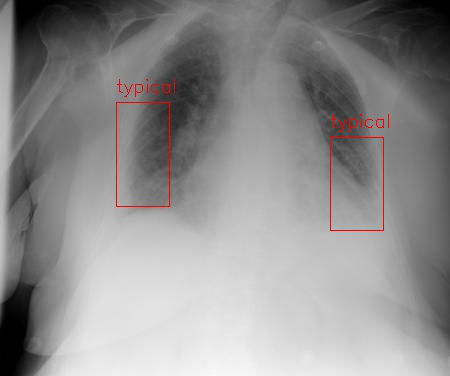

In [31]:
# datos de estudio a analizar

jpg_file_name = '65761e66de9f.jpg'

red_subfix = '_red'

red_jpg_file_name = jpg_file_name.replace('.jpg', red_subfix+'.jpg')

dir = './data/examples/train_jpg/'

# cargamos imagen original y reducida de un estudio en JPG
jpgs = open_jpgs(jpg_file_name = jpg_file_name,
                red_jpg_file_name = red_jpg_file_name,
                dir = dir)

# almacenamos imagen ORIGINAL
jpg = jpgs[1]

# almacenamos imagen REUCIA
jpg_red = jpgs[3]

# calculo de relacion entre imagen original y la escalada
scale = jpg_red.size[0]/jpg.size[0]

# muestra resultado
#print('Ruta completa de imagen original:', jpgs[0])
#print('Ruta completa de imagen reucida:', jpgs[2])
#print(' El porcentaje de escalado es aproximadamente:', round(scale,3)*100)

# visualizamos dataframe con recuadros con diagnóstico
vis_diag_box(jpg_file_name)

# visualizamos JPG REDUCIDO con recuadros con diagnóstico
vis_diag_jpg(file_name = red_jpg_file_name,
                scale = scale,
                red_subfix = '_red',
                dir = dir)

Box 0: x, y, w, h: 720, 636, 332, 648
Box 1: x, y, w, h: 2044, 847, 329, 576
Tamaño de imagen: (2330, 2783, 3)
JPG original modificado.
Ruta de imagen: ./data/examples/train_jpg/
ID estudio: 65761e66de9f.jpg


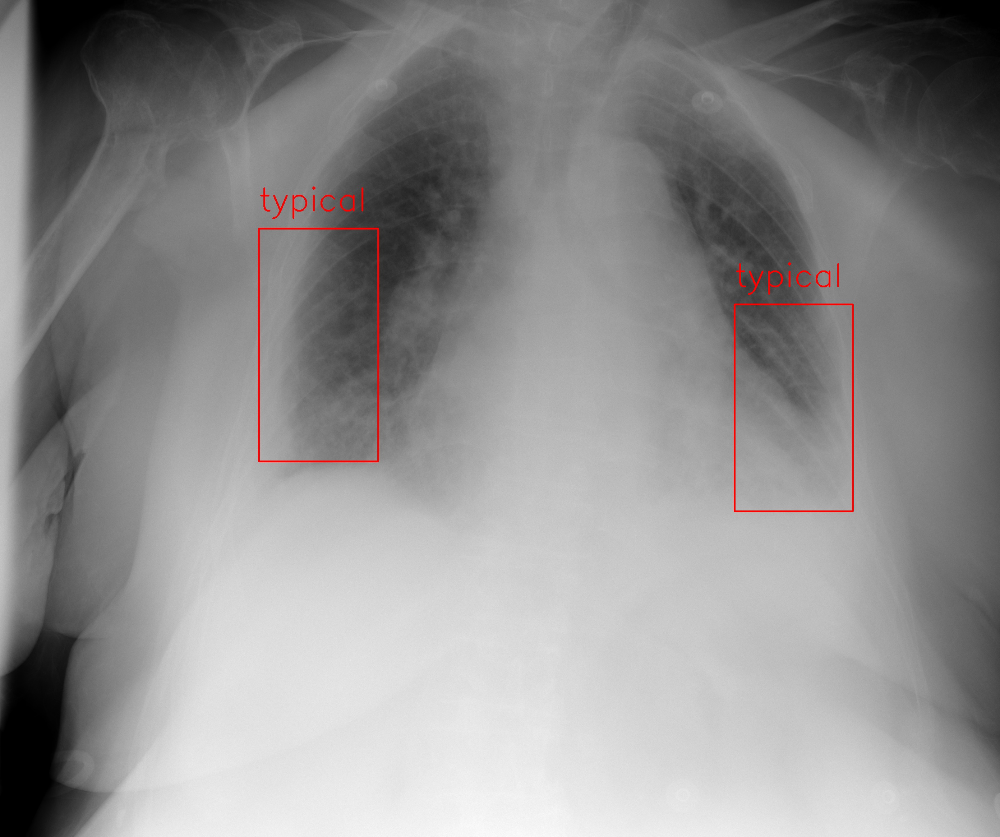

In [32]:
# datos de estudio a analizar

jpg_file_name = '65761e66de9f.jpg'

red_subfix = '_red'

red_jpg_file_name = jpg_file_name.replace('.jpg', red_subfix+'.jpg')

dir = './data/examples/train_jpg/'

# cargamos imagen original y reducida de un estudio en JPG
jpgs = open_jpgs(jpg_file_name = jpg_file_name,
                red_jpg_file_name = red_jpg_file_name,
                dir = dir)

# almacenamos imagen ORIGINAL
jpg = jpgs[1]

# almacenamos imagen REUCIA
jpg_red = jpgs[3]

# calculo de relacion entre imagen original y la escalada
scale = jpg_red.size[0]/jpg.size[0]

# muestra resultado
#print('Ruta completa de imagen original:', jpgs[0])
#print('Ruta completa de imagen reucida:', jpgs[2])
#print(' El porcentaje de escalado es aproximadamente:', round(scale,3)*100)

# visualizamos dataframe con recuadros con diagnóstico
vis_diag_box(jpg_file_name)

# visualizamos JPG REDUCIDO con recuadros con diagnóstico
vis_diag_jpg(file_name = jpg_file_name,
                scale = scale,
                red_subfix = '_red',
                dir = dir)

Imagen reducida correctamente.
Box 0: x, y, w, h: 320, 165, 63, 73
Box 1: x, y, w, h: 121, 195, 45, 58
Box 2: x, y, w, h: 124, 42, 29, 64
Tamaño de imagen: (374, 450, 3)
JPG reducido modificado.
Ruta de imagen: ./data/examples/train_jpg/
ID estudio: 74077a8e3b7c_red.jpg


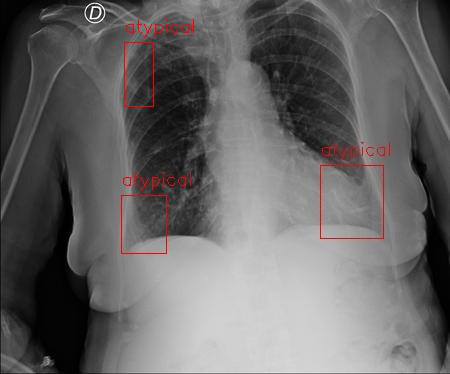

In [33]:
# datos de estudio a analizar

jpg_file_name = '74077a8e3b7c.jpg'

red_subfix = '_red'

red_jpg_file_name = jpg_file_name.replace('.jpg', red_subfix+'.jpg')

dir = './data/examples/train_jpg/'

# reducimos una imagen JPG y pasamos a escala de grises
reduce_jpg(dir = dir,
                jpg_file_name = jpg_file_name,
                output_basewidth = 450,
                output_subfix = red_subfix,
                return_jpg_red = False)

# cargamos imagen original y reducida de un estudio en JPG
jpgs = open_jpgs(jpg_file_name = jpg_file_name,
                red_jpg_file_name = red_jpg_file_name,
                dir = dir)
# almacenamos imagen ORIGINAL
jpg = jpgs[1]

# almacenamos imagen REDUCIDA
jpg_red = jpgs[3]

# calculo de relacion entre imagen original y la escalada
scale = jpg_red.size[0]/jpg.size[0]

# muestra resultado
#print('Ruta completa de imagen original:', jpgs[0])
#print('Ruta completa de imagen reucida:', jpgs[2])
#print(' El porcentaje de escalado es aproximadamente:', round(scale,3)*100)

# visualizamos dataframe con recuadros con diagnóstico
vis_diag_box(jpg_file_name)

# visualizamos JPG REDUCIDO con recuadros con diagnóstico
vis_diag_jpg(file_name = red_jpg_file_name,
                scale = scale,
                red_subfix = '_red',
                dir = dir)

Imagen reducida correctamente.
Box 0: x, y, w, h: 2175, 1123, 432, 500
Box 1: x, y, w, h: 823, 1324, 306, 394
Box 2: x, y, w, h: 845, 291, 201, 437
Tamaño de imagen: (2544, 3056, 3)
JPG original modificado.
Ruta de imagen: ./data/examples/train_jpg/
ID estudio: 74077a8e3b7c.jpg


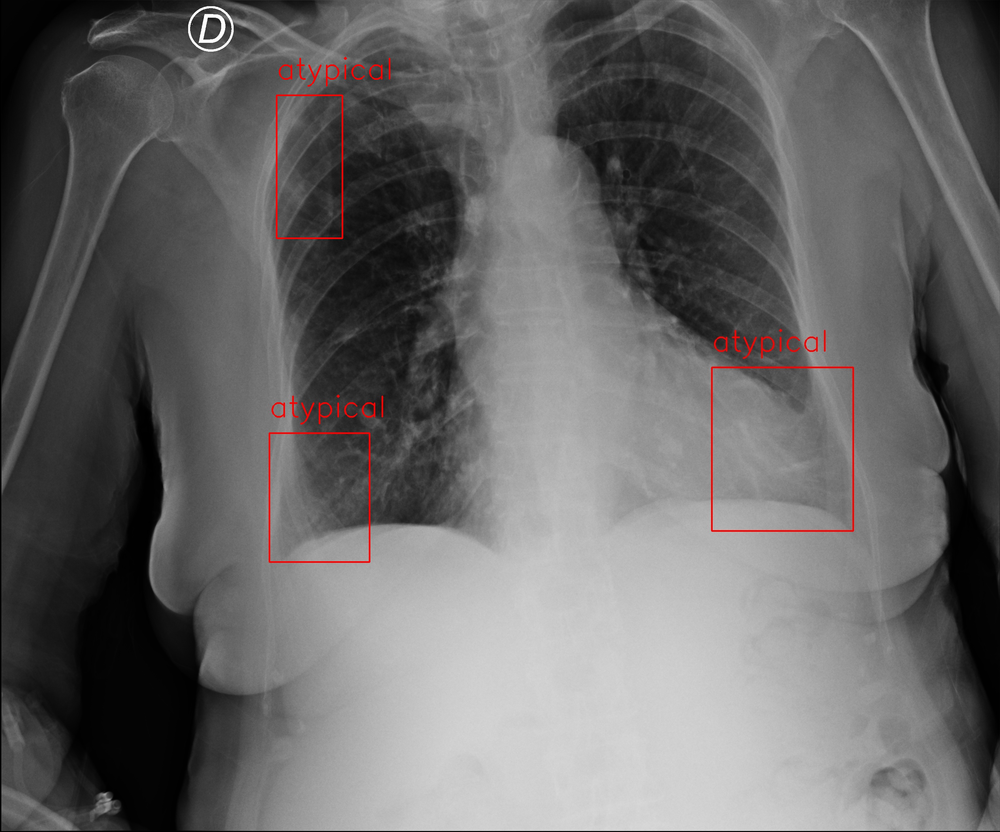

In [34]:
# datos de estudio a analizar

jpg_file_name = '74077a8e3b7c.jpg'

red_subfix = '_red'

red_jpg_file_name = jpg_file_name.replace('.jpg', red_subfix+'.jpg')

dir = './data/examples/train_jpg/'

# reducimos una imagen JPG y pasamos a escala de grises
reduce_jpg(dir = dir,
                jpg_file_name = jpg_file_name,
                output_basewidth = 450,
                output_subfix = red_subfix,
                return_jpg_red = False)

# cargamos imagen original y reducida de un estudio en JPG
jpgs = open_jpgs(jpg_file_name = jpg_file_name,
                red_jpg_file_name = red_jpg_file_name,
                dir = dir)
# almacenamos imagen ORIGINAL
jpg = jpgs[1]

# almacenamos imagen REDUCIDA
jpg_red = jpgs[3]

# calculo de relacion entre imagen original y la escalada
scale = jpg_red.size[0]/jpg.size[0]

# muestra resultado
#print('Ruta completa de imagen original:', jpgs[0])
#print('Ruta completa de imagen reucida:', jpgs[2])
#print(' El porcentaje de escalado es aproximadamente:', round(scale,3)*100)

# visualizamos dataframe con recuadros con diagnóstico
vis_diag_box(jpg_file_name)

# visualizamos JPG REDUCIDO con recuadros con diagnóstico
vis_diag_jpg(file_name = jpg_file_name,
                scale = scale,
                red_subfix = '_red',
                dir = dir)

### Conclusion de análisis simultaneo de imágenes y dataframes

Vemos que la información dada en los dataframes nos ayudaría a mejorar la predicción dado que nos podríamos enfocar en estas áreas. Por el momento no exploraremos esta información con el propósito de poner un modelo inicial en producción.

---
## Exportamos `df.csv` para análisis general de datos

In [35]:
# exportamos el CSV creado
df.to_csv('./csv/df.csv', index = False)

---
# Preparación de datos 1: Conversión de datos de estudio

### Conversión de `dcm` en `.\data\train` a `jpg` en `.\data\train_jpg`

In [36]:
# definimos carpeta de destino `train_jpg`
train_jpg_folder_path = "./data/train_jpg/"

# verificasimos si existe carpeta de destino sino es creada
if not os.path.exists(train_jpg_folder_path):
    os.makedirs(train_jpg_folder_path)

# verificamos que existan archivos en carpeta de destino sino realizamos la conversión
if not os.listdir(train_jpg_folder_path):
    print("Convirtiendo imágenes...")
    # creacion de contadores
    count_total = 0 # count total number of files
    count_new = 0 # count of new files
    # bucle para covertir archivos
    for row_index, image_name in df[['image_name_jpg']].iterrows(): # row_index: observation index, image_name: observation image name
        is_image_name_aux = df['image_name_jpg']==image_name[0] # is_image_name: image_name without extension
        dcm_full_dir_aux = df[is_image_name_aux]['full_dir'].item() # directory of original DCM file
        jpg_full_dir_aux = train_jpg_folder_path+df[is_image_name_aux]['image_name_jpg'].item() # directory of output JPG file
        count_total += 1
        if not os.path.exists(jpg_full_dir_aux): # Actions if JPG file does not exist
            count_new += 1
            ds_aux = dicom.dcmread(dcm_full_dir_aux) # read DCM file
            pixel_array_numpy_aux = ds_aux.pixel_array # calculate pixel array
            scaled_img_aux = cv2.convertScaleAbs(pixel_array_numpy_aux-np.min(pixel_array_numpy_aux), alpha=(255.0 / min(np.max(pixel_array_numpy_aux)-np.min(pixel_array_numpy_aux), 10000))) # scaling of image
            cv2.imwrite(jpg_full_dir_aux, scaled_img_aux) # save new scaled JPG file

    # muestra resultados
    print('Directorio "JPG train" contiene {} imágenes.'.format(count_total))
    print('{} imágenes fueron convertidas en esta sesión.'.format(count_new))
else:
    print('Directorio "JPG train" contiene {} imágenes convertidas anteriormente.'.format(len(os.listdir(train_jpg_folder_path))))

Directorio "JPG train" contiene 6334 imágenes convertidas anteriormente.


### Conversión de `dcm` en `.\data\test` a `jpg` en `.\data\test_jpg`

In [37]:
# definimos carpeta de origen
test_dcm_folder_path = "./data/test/"

# definimos carpeta de destino `test_jpg`
test_jpg_folder_path = "./data/test_jpg/"

# verificasimos si existe carpeta de destino sino es creada
if not os.path.exists(test_jpg_folder_path):
    os.makedirs(test_jpg_folder_path)

# creacion de contadores y lista auxiliar
count_total = 0 # count total number of files
test_walk_list = []

# verificamos que existan archivos en carpeta de destino sino realizamos la conversión
if not os.listdir(test_jpg_folder_path):
    print("Convirtiendo imágenes...")
    
    # carga de datos de carpetas, subcarpetas y archivos de un dado directorio
    for root, directories, files in os.walk(test_dcm_folder_path, topdown=False):
        test_walk_list.append(root)
        
    # creacion de un dataframe con los datos obtenidos
    df_root_folders = pd.DataFrame(test_walk_list)
    df_root_folders[0] = df_root_folders[0].str.replace('\\', '/', regex=True)
    df_root_folders[['relative','data','test','root', 'dir']] = df_root_folders[0].str.split('/', expand=True)
    df_root_folders = df_root_folders[['root']].drop_duplicates()

    # bucle de conversión
    for row_index, folder_name in df_root_folders[['root']].iterrows():
        count_total += 1
        input_dir = test_dcm_folder_path+folder_name[0]
        conv_dcm_to_jpg(input_dir = input_dir,
                        output_dir = test_jpg_folder_path,
                        return_jpg=False)

# muestra resultados
num_files_aux = len(os.listdir(test_jpg_folder_path))
print('Directorio "JPG test" contiene {} imágenes convertidas.'.format(num_files_aux))
print('{} imágenes fueron convertidas en esta sesión.'.format(count_total))

Directorio "JPG test" contiene 1263 imágenes convertidas.
0 imágenes fueron convertidas en esta sesión.


### Conclusión de preparación de datos 1

En esta sección comenzamos creando una carpeta `train_jpg` para almacenar los datos de entrenamiento. Luego utilizamos un bucle para convertir cada imagenes `DCM` del dataframe de entrenamiento `X_train` desde la carpeta `train` a una imagen `JPG` en la carpeta de destino.

---
# GPU

## Tensorflow / Keras

In [2]:
# datos de GPU
physical_device = tf.config.experimental.list_physical_devices('GPU')
print(f'Númeor de GPUs encontradas: {len(physical_device)}')
print(f'Identificación de GPU encontrada: {physical_device}')

Númeor de GPUs encontradas: 1
Identificación de GPU encontrada: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
# Seteo de GPU para entrenamiento
tf.config.experimental.set_memory_growth(physical_device[0],True)

# Verificamos si se utiliza para entrenamiento
print(f'GPU utilizada para entrenamiento: {tf.config.experimental.get_memory_growth(physical_device[0])}')

GPU utilizada para entrenamiento: True


## Pytorch

In [8]:
# datos de GPU
print(f'Númeor de GPUs encontradas: {torch.cuda.device_count()}')

# Verificamos si se utiliza para entrenamiento
print(f'GPUs disponible para entrenamiento: {torch.cuda.is_available()}')

# Seteo de GPU para entrenamiento
print(f'ID de GPUs disponible para entrenamiento: {torch.cuda.current_device()}')

Númeor de GPUs encontradas: 1
GPUs disponible para entrenamiento: True
ID de GPUs disponible para entrenamiento: 0


In [9]:
# Verificamos caracteríticas de GPU
torch.cuda.device(0)

In [10]:
# Verificamos caracteríticas de GPU
torch.cuda.get_device_name(0)

'NVIDIA GeForce RTX 3070 Laptop GPU'

In [11]:
### usamos GPU si está disponible
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# result
device

device(type='cuda')

---
# Modelo 1: ImageDataGenerator

## Preprocesado

In [43]:
# directorio que contine las imágenes
directory = './data/train_jpg/' #train_jpg_folder_path

# columna del dataframe que contiene el nombre de las imágenes
x_col = 'image_name_jpg'

# columna del dataframe que contiene la clasificación de las imágenes
y_col = 'diagnostic_cat'

# tramaño final de imágenes a reducir por el Image Data Generator
n_max_pixel = 64

# colores finales de las imágenes a reducir por el Image Data Generator
color_mode = 'grayscale'

# tamaño de batches de data
batch_size = 500

# reescalado de imágenes a reducir por el Image Data Generator 
rescale=1./255

## Train / Test split

In [44]:
# tamaño de train/test
train_val_size = 0.2

# verificamos si existe dataframe creado anteriormente
if not os.path.exists('./csv/model_1_df_train.csv'):
    # train / val split
    model_1_df_train, model_1_df_val = model_selection.train_test_split(df[['image_name_jpg','diagnostic_cat']],
                                                                        test_size=train_val_size,
                                                                        random_state=123,
                                                                        shuffle=True)
    # exportamos el csv creado
    model_1_df_train.to_csv('./csv/model_1_df_train.csv', index=False)
    model_1_df_val.to_csv('./csv/model_1_df_val.csv', index=False)
else:
    # cargamos dataframe
    model_1_df_train = pd.read_csv('./csv/model_1_df_train.csv')
    model_1_df_val = pd.read_csv('./csv/model_1_df_val.csv')

print("Los datos de entrenamiento son:", model_1_df_train.shape[0])
print("Los datos de validación son:", model_1_df_val.shape[0])

Los datos de entrenamiento son: 5067
Los datos de validación son: 1267


In [45]:
# análisis de datos de entrenamiento
model_1_df_train['diagnostic_cat'].value_counts()

typical              2376
neg_for_pneumonia    1406
indeterminate         899
atypical              386
Name: diagnostic_cat, dtype: int64

In [46]:
# análisis de datos de validación
model_1_df_val['diagnostic_cat'].value_counts()

typical              631
neg_for_pneumonia    330
indeterminate        209
atypical              97
Name: diagnostic_cat, dtype: int64

In [47]:
# creacion del Image Data Generator genérico
data_generator_1 = ImageDataGenerator(rescale = rescale)

# creacion del Image Data Generator para datos de training
train_generator_1 = data_generator_1.flow_from_dataframe(dataframe = model_1_df_train,
                                                        directory = directory, 
                                                        x_col =  x_col,
                                                        y_col = y_col,
                                                        batch_size = batch_size,
                                                        seed = 123,
                                                        shuffle = True,
                                                        class_mode = 'categorical',
                                                        target_size = (n_max_pixel, n_max_pixel), 
                                                        color_mode = color_mode
                                                        )

# creacion del Image Data Generator para datos de validación
val_generator_1 = data_generator_1.flow_from_dataframe(dataframe = model_1_df_val,
                                                        directory = directory, 
                                                        x_col =  x_col,
                                                        y_col = y_col,
                                                        batch_size = batch_size,
                                                        seed = 123,
                                                        shuffle = True,
                                                        class_mode = 'categorical',
                                                        target_size = (n_max_pixel, n_max_pixel), 
                                                        color_mode = color_mode
                                                        )

Found 5067 validated image filenames belonging to 4 classes.
Found 1267 validated image filenames belonging to 4 classes.


In [48]:
# clases del image data generator
print(train_generator_1.class_indices)

print(val_generator_1.class_indices)

{'atypical': 0, 'indeterminate': 1, 'neg_for_pneumonia': 2, 'typical': 3}
{'atypical': 0, 'indeterminate': 1, 'neg_for_pneumonia': 2, 'typical': 3}


## Modelo

In [49]:
# argumentos para capa inicial de modelo
input_shape = (n_max_pixel, n_max_pixel, 1)

# modelo CCN
model_1 = Sequential([
        Dense(32, input_shape=input_shape),
        Activation('relu'),
        Dense(64),
        Activation('relu'),
        Flatten(),
        Dense(128),
        Activation('relu'),
        Dropout(0.5),
        Dense(4),
        Activation('softmax')
        ])

# compilación de modelo
model_1.compile(optimizers.RMSprop(learning_rate=0.001, decay=1e-6),
                loss="categorical_crossentropy",
                metrics=["accuracy"])

In [50]:
# muestra modelo creado
model_1.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 64, 64, 32)        64        
_________________________________________________________________
activation (Activation)      (None, 64, 64, 32)        0         
_________________________________________________________________
dense_1 (Dense)              (None, 64, 64, 64)        2112      
_________________________________________________________________
activation_1 (Activation)    (None, 64, 64, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 262144)            0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               33554560  
_________________________________________________________________
activation_2 (Activation)    (None, 128)               0

In [51]:
# argumentos para entrenamiento de modelo
step_size_train_1 = train_generator_1.n//train_generator_1.batch_size
step_size_val_1  = val_generator_1.n//val_generator_1.batch_size

In [52]:
# definimos ubicacion para guardar modelos
model_dir = "./models/"

# creamos carpeta si no existe
if not os.path.exists(model_dir):
    os.makedirs(model_dir)

In [53]:
# verificamos si existe un modelo previamente entrenado
model_1_hist_file_json = model_dir+'model_1_history.json' 
model_1_hist_file_csv = model_dir+'model_1_history.csv'
    
if not os.path.exists(model_dir+'model_1_img_data_gen.h5'):
    # entrenamiento de modelo
    model_1_history = model_1.fit(x = train_generator_1,
                                    steps_per_epoch = step_size_train_1,
                                    validation_data = val_generator_1,
                                    validation_steps = step_size_val_1,
                                    epochs=20
                                    )
    # guardamos modelo
    model_1.save(model_dir+'model_1_img_data_gen.h5')
    
    # convertimos entrenamiento en dataframe     
    model_1_history_df = pd.DataFrame(model_1_history.history) 
    
    # guardamos datos de entrenamiento en formato JSON
    with open(model_1_hist_file_json, 'wb') as handle: # saving the history of the model
        pickle.dump(model_1_history.history, handle)
        model_1_loaded = False
        
    # guardamos datos de entrenamiento en formato CSV
    model_1_history_df.to_csv(model_1_hist_file_csv, index = False)
    
else:
    model_1_loaded = True
    print('Modelo 1 entrenado en sesión anterior.')


Modelo 1 entrenado en sesión anterior.


## Evaluación

In [54]:
# comprobamos accuracy de modelo basandonos en los datos de validation
model_1.evaluate(x = val_generator_1, steps = step_size_val_1)

2/2 [==============================] - 40s 19s/step - loss: 1.3905 - accuracy: 0.1600


[1.3905022144317627, 0.1599999964237213]

In [55]:
# histórico de accuracy y losses   
if model_1_loaded == True:
    # abrimos histórico en formato JSON
    with open(model_1_hist_file_json, 'rb') as handle: 
        model_1_history = pickle.load(handle)
    
    # abrimos histórico en formato CSV
    #model_1_history = pd.read_csv('model_1_hist_file_csv')
        
    tf_acc = model_1_history['accuracy']
    tf_val_acc = model_1_history['val_accuracy']
    tf_loss = model_1_history['loss']
    tf_val_loss = model_1_history['val_loss']
else:
    tf_acc = model_1_history.history['accuracy']
    tf_val_acc = model_1_history.history['val_accuracy']
    tf_loss = model_1_history.history['loss']
    tf_val_loss = model_1_history.history['val_loss']


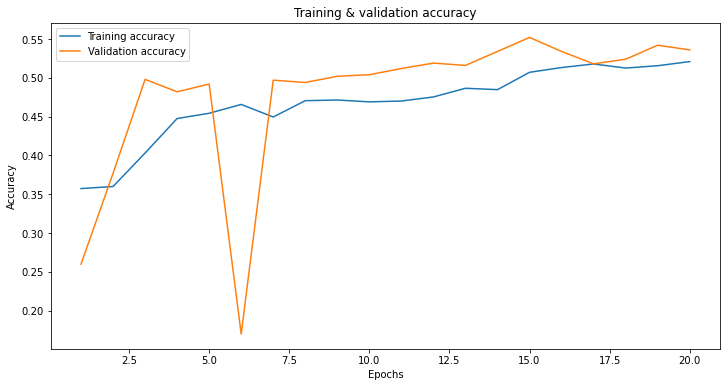

In [56]:
# definimos cantidad de epochs 
tf_epochs = range(1, len(tf_acc) + 1)

# parámetros de gráfico
plt.figure(figsize=(12, 6))

# plot de accuracy de entrenamiento
plt.plot(tf_epochs, tf_acc, label='Training accuracy')

# plot de accuracy de test
plt.plot(tf_epochs, tf_val_acc, label='Validation accuracy')

# visualización
plt.title('Training & validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

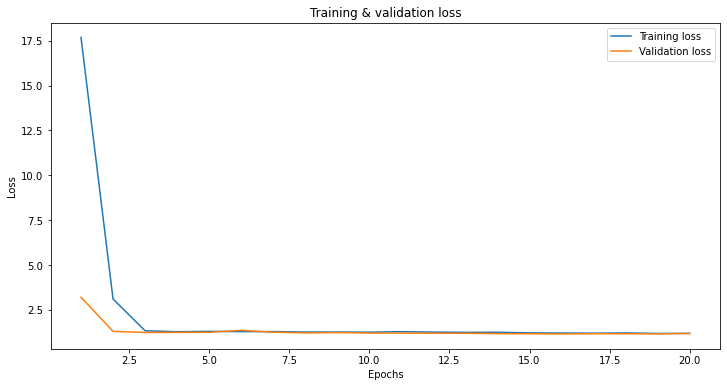

In [57]:
# parámetros de gráfico
plt.figure(figsize=(12, 6))

# plot de loss de entrenamiento
plt.plot(tf_epochs, tf_loss, label='Training loss')

# plot de loss de test
plt.plot(tf_epochs, tf_val_loss, label='Validation loss')

# visualización
plt.title('Training & validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [59]:
if not os.path.exists('./csv/model_1_df_val_eval.csv'):    
    
    # cálculo de probabilida de predicciones
    model_1_pred_val = model_1.predict(val_generator_1)

    # muestra probabilida de predicciones de datos de validación
    model_1_df_val_pred = pd.DataFrame(pd.DataFrame(model_1_pred_val, columns=val_generator_1.class_indices))

    # muestra predicciones de datos de validación (mayor probabilidad)
    model_1_df_val_pred['diagnostic_cat_pred'] = model_1_df_val_pred.idxmax(axis=1)

    # unimos dataframes para evaluación
    model_1_df_val_eval = pd.concat([model_1_df_val.reset_index(), model_1_df_val_pred], axis = 1)

    # quitamos columnas no relevantes
    model_1_df_val_eval = model_1_df_val_eval.drop(columns = ['index'])
    
    # exportamos CSV
    model_1_df_val_eval.to_csv('./csv/model_1_df_val_eval.csv', index = False)

else:
    # cargamos dataframe
    model_1_df_val_eval = pd.read_csv('./csv/model_1_df_val_eval.csv')

# muestra resultados
model_1_df_val_eval

,index,image_name_jpg,diagnostic_cat,atypical,indeterminate,neg_for_pneumonia,typical,diagnostic_cat_pred
0,0,81eb2ea84b8a.jpg,typical,0.229451,0.279074,0.248686,0.242789,indeterminate
1,1,6728e11290af.jpg,typical,0.222773,0.292140,0.247981,0.237106,indeterminate
2,2,7064823e0cf2.jpg,atypical,0.184100,0.317636,0.266822,0.231443,indeterminate
3,3,c2e09dcc6455.jpg,atypical,0.216575,0.266707,0.269606,0.247112,neg_for_pneumonia
4,4,685114c3c9fd.jpg,typical,0.204932,0.288354,0.257172,0.249542,indeterminate
...,...,...,...,...,...,...,...,...
1262,1262,4123a71d9796.jpg,typical,0.214390,0.276505,0.253978,0.255127,indeterminate
1263,1263,8111093dcda1.jpg,typical,0.229851,0.282639,0.247834,0.239677,indeterminate
1264,1264,279bde1a7b20.jpg,neg_for_pneumonia,0.183888,0.322065,0.262431,0.231616,indeterminate
1265,1265,23c05cf9e8e0.jpg,typical,0.215362,0.301156,0.248914,0.234569,indeterminate


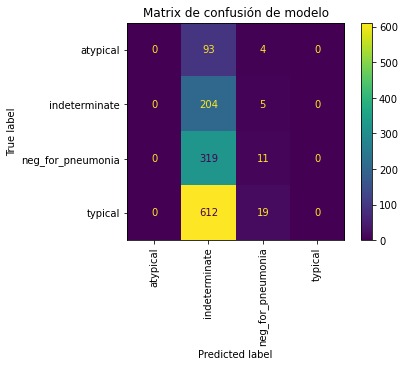

<Figure size 576x576 with 0 Axes>

Reporte de clasificación de modelo:
                   precision    recall  f1-score   support

         atypical       0.00      0.00      0.00        97
    indeterminate       0.17      0.98      0.28       209
neg_for_pneumonia       0.28      0.03      0.06       330
          typical       0.00      0.00      0.00       631

         accuracy                           0.17      1267
        macro avg       0.11      0.25      0.09      1267
     weighted avg       0.10      0.17      0.06      1267




C:\Programs\anaconda3\envs\bdds_tfm_env\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Programs\anaconda3\envs\bdds_tfm_env\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Programs\anaconda3\envs\bdds_tfm_env\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [60]:
# creamos matriz de confusion
conf_mat_1 = confusion_matrix(y_true=model_1_df_val_eval['diagnostic_cat'],
                                y_pred = model_1_df_val_eval['diagnostic_cat_pred'])

# mostramos matriz de confusion
disp = ConfusionMatrixDisplay(confusion_matrix=conf_mat_1, display_labels=['atypical', 'indeterminate', 'neg_for_pneumonia', 'typical'])
disp.plot(xticks_rotation='vertical')
plt.title('Matrix de confusión de modelo')
plt.figure(figsize = (8,8))
plt.show()

# muestra reporte de modelo de clasificación supervisado
print(f"Reporte de clasificación de modelo:\n"
        f"{classification_report(y_true=model_1_df_val_eval['diagnostic_cat'], y_pred = model_1_df_val_eval['diagnostic_cat_pred'])}\n")

## Conclusiones

Las características del modelo de redes neuronales que crearemos son las siguientes:

- Capas de redes neuronales: Utilizaremos layers con el objetivo de intentar conseguir un modelo inicial. Por ejemplo utilizando `Dense` layers (conexión profunda), `flatten` layers para preservar el orden de los weights y `dropout` layers para evitar overfitting. También utilizaremos como función de activación la `ReLu`. La última layer debe ser de múltiple clasificación por lo que utilizamos la función de activación `softmax`.

- Función de costes: Se selecciona `Multi-Label Cross Entropy` como loss function a utilizar considerando que estamos ante un problema de clasificación múltiple. 

- Optimizador: Se selecciona `RMSprop` como optimizador. La tasa de aprendizaje o `learning rate` utilizado es considerablemente bajo para obtener los mínimos valores de la loss function. Esto no es un problema para este caso ya que no es necesario que el aprendizaje del modelo tarde algunas horas.

Dividimos el total de la imágenes en un 75% para `entrenamiento` y el restante 25% para `validación`. El accuracy del modelo secuencial inicial creado es aproximadamente 50 %.

---
# Preparación de datos 2: Limpieza de datos

## Comparación de imágenes individuales

In [62]:
# creamos función de preparación de imágenes
def image_prep(dir = './data/examples/train_jpg/',
                img = '6534a837497d_red.jpg',
                width = 450,
                height = 375):
    """Función para cargar una imágen y prepararla para comparación.

    Args:
        dir (str, optional): ruta a ubicació de archivo de imagen JPG.. Defaults to './data/examples/train_jpg/'.
        img (str, optional): nombre de archivo con extensión.. Defaults to '6534a837497d_red.jpg'.
        width (int, optional): ancho de la imágen preparada.. Defaults to 450.
        height (int, optional): alto de la imágen preparada.. Defaults to 375.

    Returns:
        [cv2 image]: imagen CV2 en escala de grises y con tamaño ajustado.
    """
    
    # cargamos la imagen
    img_full_dir = dir+img
    img = cv2.imread(img_full_dir)
    
    # transformamos a escala de grises
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # convertimos las dimensiones de la imagen
    img = cv2.resize(img, (width, height), interpolation = cv2.INTER_AREA)
    
    return img

In [63]:
# creamos función de cálculo de de MSE entre 2 imágenes
def mse_calc(imageA,
        imageB):
	"""Función que calcula el error cuadrático medio (Mean Squared Error) entre 2 imágenes. Esto es la suma del cuadrado de las diferencias entre las 2 imágenes.
	Las imágenes deben tener la misma dimensión.

	Args:
		imageA ([cv2_image]): Imágen 1 a comparar.
		imageB ([cv2_image]): Imágen 2 a comparar.

	Returns:
		[num]: MSE. Mientras más bajo el error, más similares son las imágenes entre si.
	"""
	err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
	err /= float(imageA.shape[0] * imageA.shape[1])
	
	return err

In [64]:
# creamos función de comparación entre imágenes
def compare_images(imageA,
                    imageB,
                    show_images = False):
	"""Función para comparar imágenes por medio del error cuadrático medio y el índice de similaridad de estructura.

	Args:
		imageA ([cv2 image]): imagen original a comparar.
		imageB ([cv2 image]): imagen 2 a comparar.
		show_images (bool, optional): True: muestra imágenes. Defaults to False.
	"""
    # cálculo de errores y similitud entre imágenes
	mse_value = mse_calc(imageA, imageB).round(4)
	ssim_value = ssim(imageA, imageB).round(4)
	if show_images == True:
		# seteo de figura
		fig = plt.figure(figsize=(10,4))
		fig.suptitle('Comparación de imágenes')
		plt.title("MSE: %.2f - SSIM: %.2f" % (mse_value, ssim_value))
		plt.axis('off')
		# muestra 1ra imagen
		ax = fig.add_subplot(1, 2, 1)
		plt.title("Original")
		plt.imshow(imageA, cmap = plt.cm.gray, aspect='auto')
		plt.axis("off")
		# muestra 2da imagen
		ax = fig.add_subplot(1, 2, 2)
		plt.imshow(imageB, cmap = plt.cm.gray, aspect='auto')
		plt.axis("off")
		# show the images
		plt.show()
	
	return mse_value, ssim_value

In [65]:
# seleccionamos imágenes de prueba a comparar
img_original = image_prep(dir = './data/examples/train_jpg/',
                img = '6534a837497d_red.jpg',
                width = 450,
                height = 375)

img_to_comp = image_prep(dir = './data/examples/train_jpg/',
                img = '65761e66de9f_red.jpg',
                width = 450,
                height = 375)

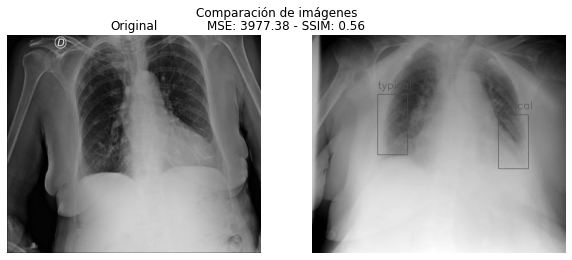

(3977.3799, 0.5553)

In [66]:
# comparamos imágenes
compare_images(img_original, img_to_comp, show_images= True)

In [67]:
# comparamos imágenes
print('La diferencia entre la imagen original y la comparada es, en porcentaje, aproximadamente:',
        compare_images(img_original, img_to_comp, show_images= False)[1]*100)


La diferencia entre la imagen original y la comparada es, en porcentaje, aproximadamente: 55.53


## Comparación de imágenes en directorio

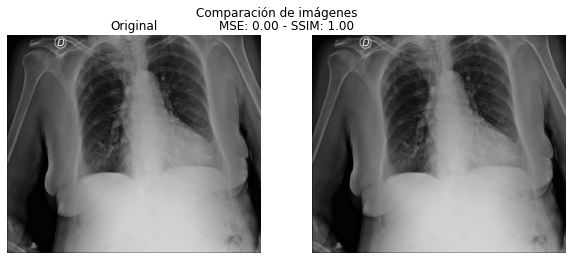

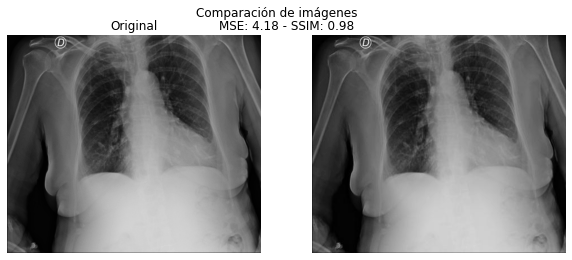

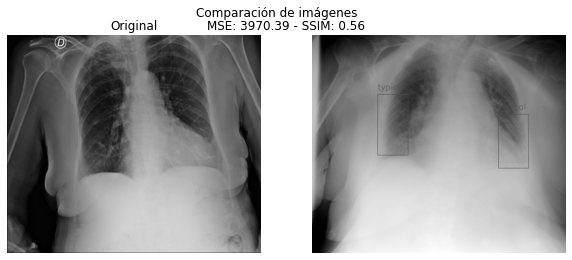

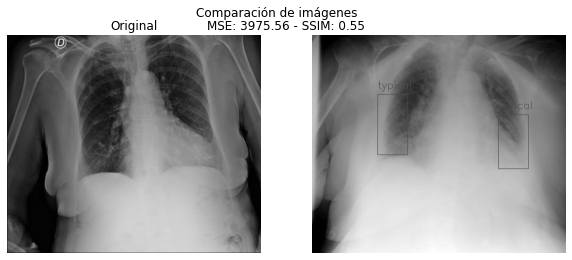

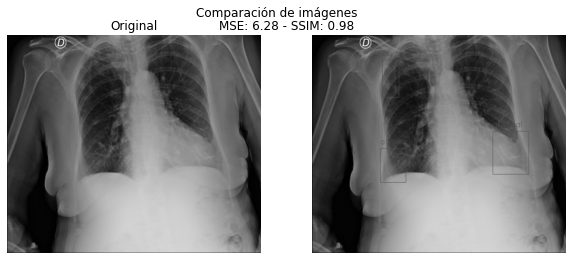

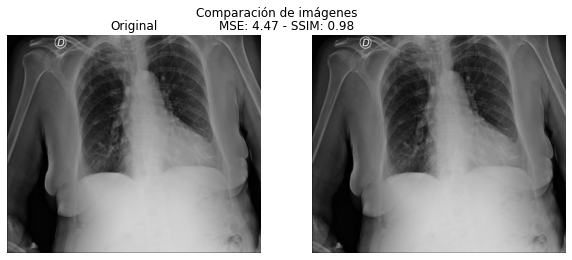

In [68]:
# datos de imagen original a comparar
dir = './data/examples/train_jpg/'
template = '6534a837497d.jpg'
width = 450
height = 375

# cargamos imagen
img_original = image_prep(dir = dir,
                img = template,
                width = width,
                height = height)

# creacion de contadores
count_total = 0 # count total number of files

# bucle de comparación
for root, directories, files in os.walk(dir, topdown=False):
    for name in files:
        img_to_comp = image_prep(dir = dir,
                                    img = name,
                                    width = width,
                                    height = height)
        compare_images(img_original, img_to_comp, show_images= True)

In [69]:
if not os.path.exists('./csv/df_cleaned.csv'):
    # datos de imagen original a comparar
    dir = './data/train_jpg/'
    template = '000a312787f2.jpg'
    width = 450
    height = 375

    # cargamos imagen
    img_original = image_prep(dir = dir,
                    img = template,
                    width = width,
                    height = height)

    # creacion de contadores
    count_total = 0 # count total number of files

    # bucle de comparación de template con estudios del dataframe
    for row_index, image_name in df[['image_name_jpg']].iterrows(): # row_index: observation index, image_name: observation image name
        img_to_comp = image_prep(dir = dir,
                                    img = image_name[0],
                                    width = width,
                                    height = height)
        df.loc[df['image_name_jpg']==image_name[0],['comparison']] = compare_images(img_original,
                                                                                                        img_to_comp,
                                                                                                        show_images= False)[1]
        count_total += 1

    # muestra resultados
    print('Directorio JPG train folder contiene {} imágenes que fueron comparadas.'.format(count_total))
    
    df_cleaned = df
    
else:
    # cargamos dataframe
    df_cleaned = pd.read_csv('./csv/df_cleaned.csv')

In [70]:
df_cleaned.iloc[:5]

,study_dir,full_dir,boxes,label,StudyInstanceUID,diagnostic_cat,image_name_jpg,comparison
0,00086460a852,./data/train/00086460a852/9e8302230c91/65761e6...,"[{'x': 720.65215, 'y': 636.51048, 'width': 332...",opacity 1 720.65215 636.51048 1052.84563 1284....,00086460a852,typical,65761e66de9f.jpg,0.5709
1,000c9c05fd14,./data/train/000c9c05fd14/e555410bd2cd/51759b5...,NaN,none 1 0 0 1 1,000c9c05fd14,atypical,51759b5579bc.jpg,0.4531
2,00292f8c37bd,./data/train/00292f8c37bd/73120b4a13cb/f6293b1...,NaN,none 1 0 0 1 1,00292f8c37bd,neg_for_pneumonia,f6293b1c49e2.jpg,0.4507
3,005057b3f880,./data/train/005057b3f880/e34afce999c5/3019399...,NaN,none 1 0 0 1 1,005057b3f880,neg_for_pneumonia,3019399c31f4.jpg,0.2650
4,0051d9b12e72,./data/train/0051d9b12e72/152f6ec68d86/bb4b1da...,"[{'x': 812.54698, 'y': 1376.41291, 'width': 62...",opacity 1 812.54698 1376.41291 1435.14793 1806...,0051d9b12e72,atypical,bb4b1da810f3.jpg,0.3243


In [71]:
df_cleaned.describe()

,comparison
count,6334.000000
mean,0.445951
std,0.078096
min,0.120600
25%,0.399200
50%,0.462750
75%,0.505800
max,1.000000


## Conclusion de preparación de datos 2

---
## Exportamos `df_cleaned.csv` para visualización y modelo 2

In [72]:
# exportamos el csv creado
df_cleaned.to_csv('./csv/df_cleaned.csv', index = False)

---
# Modelo 2: Improved ImageDataGenerator

## Preprocesado

In [73]:
# directorio que contine las imágenes
directory = './data/train_jpg/' #train_jpg_folder_path

# columna del dataframe que contiene el nombre de las imágenes
x_col = 'image_name_jpg'

# columna del dataframe que contiene la clasificación de las imágenes
y_col = 'diagnostic_cat'

# tramaño final de imágenes a reducir por el Image Data Generator
n_max_pixel = 64

# colores finales de las imágenes a reducir por el Image Data Generator
color_mode = 'grayscale'

# tamaño de batches de data
batch_size = 500

# reescalado de imágenes a reducir por el Image Data Generator 
rescale=1./255

## Train / Test split

In [74]:
# tamaño de train/test
train_val_size = 0.2
comparison_threshold = 0.4

# verificamos si existe dataframe creado anteriormente
if not os.path.exists('./csv/model_2_df_train.csv'):
    # train / val split
    model_2_df_train, model_2_df_val = model_selection.train_test_split(df_cleaned.loc[df_cleaned['comparison']>=comparison_threshold, ['image_name_jpg','diagnostic_cat']],
                                                                        test_size=train_val_size,
                                                                        random_state=123,
                                                                        shuffle=True,
                                                                        stratify=df_cleaned.loc[df_cleaned['comparison']>=comparison_threshold, ['diagnostic_cat']])
    # exportamos el csv creado
    model_2_df_train.to_csv('./csv/model_2_df_train.csv', index=False)
    model_2_df_val.to_csv('./csv/model_2_df_val.csv', index=False)
else:
    # cargamos dataframe
    model_2_df_train = pd.read_csv('./csv/model_2_df_train.csv')
    model_2_df_val = pd.read_csv('./csv/model_2_df_val.csv')

print("Los datos de entrenamiento son:", model_2_df_train.shape[0])
print("Los datos de validación son:", model_2_df_val.shape[0])

Los datos de entrenamiento son: 3788
Los datos de validación son: 948


In [75]:
# análisis de datos de entrenamiento
model_2_df_train['diagnostic_cat'].value_counts()

typical              1762
neg_for_pneumonia    1056
indeterminate         677
atypical              293
Name: diagnostic_cat, dtype: int64

In [76]:
# análisis de datos de validación
model_2_df_val['diagnostic_cat'].value_counts()

typical              441
neg_for_pneumonia    264
indeterminate        169
atypical              74
Name: diagnostic_cat, dtype: int64

In [77]:
# creacion del Image Data Generator genérico
data_generator_2 = ImageDataGenerator(rescale = rescale)

# creacion del Image Data Generator para datos de training
train_generator_2 = data_generator_2.flow_from_dataframe(dataframe = model_2_df_train,
                                                        directory = directory, 
                                                        x_col =  x_col,
                                                        y_col = y_col,
                                                        batch_size = batch_size,
                                                        seed = 123,
                                                        shuffle = True,
                                                        class_mode = 'categorical',
                                                        target_size = (n_max_pixel, n_max_pixel), 
                                                        color_mode = color_mode
                                                        )

# creacion del Image Data Generator para datos de validación
val_generator_2 = data_generator_2.flow_from_dataframe(dataframe = model_2_df_val,
                                                        directory = directory, 
                                                        x_col =  x_col,
                                                        y_col = y_col,
                                                        batch_size = batch_size,
                                                        seed = 123,
                                                        shuffle = True,
                                                        class_mode = 'categorical',
                                                        target_size = (n_max_pixel, n_max_pixel), 
                                                        color_mode = color_mode
                                                        )

Found 3788 validated image filenames belonging to 4 classes.
Found 948 validated image filenames belonging to 4 classes.


In [78]:
# clases del image data generator
print(train_generator_2.class_indices)

print(val_generator_2.class_indices)

{'atypical': 0, 'indeterminate': 1, 'neg_for_pneumonia': 2, 'typical': 3}
{'atypical': 0, 'indeterminate': 1, 'neg_for_pneumonia': 2, 'typical': 3}


## Modelo

In [79]:
# argumentos para capa inicial de modelo
input_shape = (n_max_pixel, n_max_pixel, 1)

# modelo CCN
model_2 = Sequential([
        Dense(32, input_shape=input_shape),
        Activation('relu'),
        Dense(64),
        Activation('relu'),
        Flatten(),
        Dense(128),
        Activation('relu'),
        Dropout(0.5),
        Dense(4),
        Activation('softmax')
        ])

# compilación de modelo
model_2.compile(optimizers.RMSprop(learning_rate=0.001, decay=1e-6),
                loss="categorical_crossentropy",
                metrics=["accuracy"])

In [80]:
# muestra modelo creado
model_2.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 64, 64, 32)        64        
_________________________________________________________________
activation_4 (Activation)    (None, 64, 64, 32)        0         
_________________________________________________________________
dense_5 (Dense)              (None, 64, 64, 64)        2112      
_________________________________________________________________
activation_5 (Activation)    (None, 64, 64, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 262144)            0         
_________________________________________________________________
dense_6 (Dense)              (None, 128)               33554560  
_________________________________________________________________
activation_6 (Activation)    (None, 128)              

In [81]:
# argumentos para entrenamiento de modelo
step_size_train_2 = train_generator_2.n//train_generator_2.batch_size
step_size_val_2  = val_generator_2.n//val_generator_2.batch_size

In [82]:
# verificamos si existe un modelo previamente entrenado
model_2_hist_file_json = model_dir+'model_2_history.json' 
model_2_hist_file_csv = model_dir+'model_2_history.csv'

if not os.path.exists(model_dir+'model_2_img_data_gen.h5'):
    # entrenamiento de modelo
    model_2_history = model_2.fit(x = train_generator_2,
                            steps_per_epoch = step_size_train_2,
                            validation_data = val_generator_2,
                            validation_steps = step_size_val_2,
                            epochs=20
                            )
    # guardamos modelo
    model_2.save(model_dir+'model_2_img_data_gen.h5')
    
    # convertimos entrenamiento en dataframe     
    model_2_history_df = pd.DataFrame(model_2_history.history) 
    
    # guardamos datos de entrenamiento en formato JSON
    with open(model_2_hist_file_json, 'wb') as handle: # saving the history of the model
        pickle.dump(model_2_history.history, handle)
        model_2_loaded = False
        
    # guardamos datos de entrenamiento en formato CSV
    model_2_history_df.to_csv(model_2_hist_file_csv, index = False)
    
else:
    model_2_loaded = True
    print('Modelo 2 entrenado en sesión anterior.')

Modelo 2 entrenado en sesión anterior.


## Evaluación

In [83]:
# comprobamos accuracy de modelo basandonos en los datos de validation
model_2.evaluate(x = val_generator_2, steps = step_size_val_2)

1/1 [==============================] - 18s 18s/step - loss: 1.3872 - accuracy: 0.2660


[1.3872151374816895, 0.26600000262260437]

In [84]:
# histórico de accuracy y losses   
if model_2_loaded == True:
    # abrimos histórico en formato JSON
    with open(model_2_hist_file_json, 'rb') as handle: 
        model_2_history = pickle.load(handle)
    
    # abrimos histórico en formato CSV
    #model_2_history = pd.read_csv('model_2_hist_file_csv')
        
    tf_acc = model_2_history['accuracy']
    tf_val_acc = model_2_history['val_accuracy']
    tf_loss = model_2_history['loss']
    tf_val_loss = model_2_history['val_loss']
else:
    tf_acc = model_2_history.history['accuracy']
    tf_val_acc = model_2_history.history['val_accuracy']
    tf_loss = model_2_history.history['loss']
    tf_val_loss = model_2_history.history['val_loss']


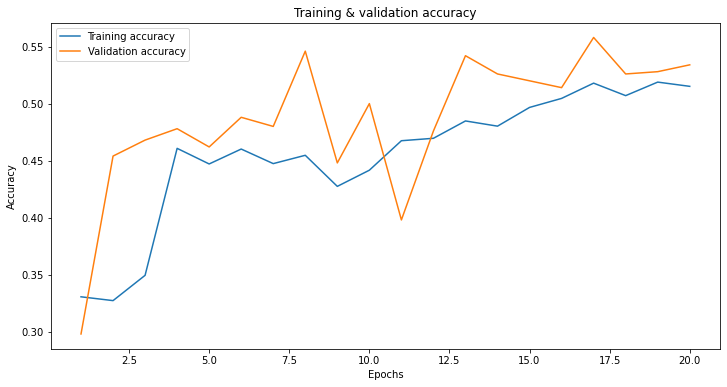

In [85]:
# definimos cantidad de epochs 
tf_epochs = range(1, len(tf_acc) + 1)

# parámetros de gráfico
plt.figure(figsize=(12, 6))

# plot de accuracy de entrenamiento
plt.plot(tf_epochs, tf_acc, label='Training accuracy')

# plot de accuracy de test
plt.plot(tf_epochs, tf_val_acc, label='Validation accuracy')

# visualización
plt.title('Training & validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

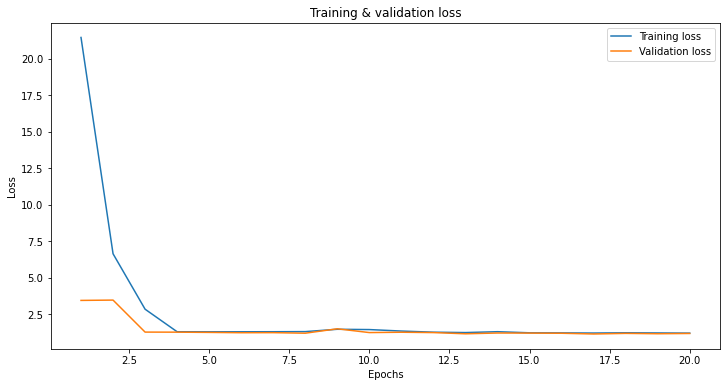

In [86]:
# parámetros de gráfico
plt.figure(figsize=(12, 6))

# plot de loss de entrenamiento
plt.plot(tf_epochs, tf_loss, label='Training loss')

# plot de loss de test
plt.plot(tf_epochs, tf_val_loss, label='Validation loss')

# visualización
plt.title('Training & validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [87]:
# cálculo de probabilida de predicciones
model_2_pred_val = model_2.predict(val_generator_2)

In [88]:
if not os.path.exists('./csv/model_2_df_val_eval.csv'):     
    
    # cálculo de probabilida de predicciones
    model_2_pred_val = model_2.predict(val_generator_2)
    
    # muestra probabilida de predicciones de datos de validación
    model_2_df_val_pred = pd.DataFrame(pd.DataFrame(model_2_pred_val, columns=val_generator_2.class_indices))

    # muestra predicciones de datos de validación (mayor probabilidad)
    model_2_df_val_pred['diagnostic_cat_pred'] = model_2_df_val_pred.idxmax(axis=1)

    # unimos dataframes para evaluación
    model_2_df_val_eval = pd.concat([model_2_df_val.reset_index(), model_2_df_val_pred], axis = 1)

    # quitamos columnas no relevantes
    model_2_df_val_eval = model_2_df_val_eval.drop(columns = ['index'])
    
    # exportamos CSV
    model_2_df_val_eval.to_csv('./csv/model_2_df_val_eval.csv', index = False)

else:
    # cargamos dataframe
    model_2_df_val_eval = pd.read_csv('./csv/model_2_df_val_eval.csv')


# muestra resultados
model_2_df_val_eval

,index,image_name_jpg,diagnostic_cat,atypical,indeterminate,neg_for_pneumonia,typical,diagnostic_cat_pred
0,0,ccdc93ecab12.jpg,typical,0.252970,0.211341,0.287920,0.247769,neg_for_pneumonia
1,1,ea4e6f4d1276.jpg,indeterminate,0.255863,0.218583,0.280015,0.245540,neg_for_pneumonia
2,2,0f501fe67203.jpg,typical,0.267881,0.217174,0.270884,0.244061,neg_for_pneumonia
3,3,04ee02f3b685.jpg,indeterminate,0.255682,0.227326,0.266478,0.250514,neg_for_pneumonia
4,4,5b8d34cda68e.jpg,typical,0.261171,0.213584,0.284343,0.240902,neg_for_pneumonia
...,...,...,...,...,...,...,...,...
943,943,b386bcbb0490.jpg,typical,0.261209,0.210886,0.275961,0.251944,neg_for_pneumonia
944,944,fdb8954398a5.jpg,typical,0.255375,0.206747,0.288803,0.249074,neg_for_pneumonia
945,945,bdbe3fa1b316.jpg,neg_for_pneumonia,0.256243,0.231380,0.267497,0.244881,neg_for_pneumonia
946,946,0c7b15362352.jpg,neg_for_pneumonia,0.258790,0.225003,0.273791,0.242415,neg_for_pneumonia


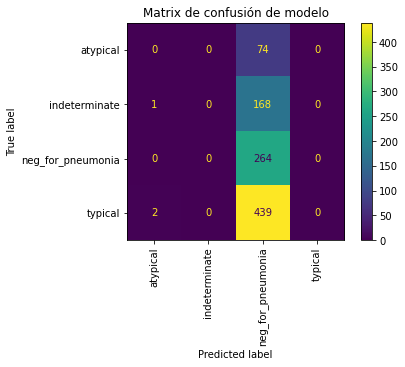

<Figure size 576x576 with 0 Axes>

Reporte de clasificación de modelo:
                   precision    recall  f1-score   support

         atypical       0.00      0.00      0.00        74
    indeterminate       0.00      0.00      0.00       169
neg_for_pneumonia       0.28      1.00      0.44       264
          typical       0.00      0.00      0.00       441

         accuracy                           0.28       948
        macro avg       0.07      0.25      0.11       948
     weighted avg       0.08      0.28      0.12       948




C:\Programs\anaconda3\envs\bdds_tfm_env\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Programs\anaconda3\envs\bdds_tfm_env\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Programs\anaconda3\envs\bdds_tfm_env\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [89]:
# creamos matriz de confusion
conf_mat_2 = confusion_matrix(y_true=model_2_df_val_eval['diagnostic_cat'],
                                y_pred = model_2_df_val_eval['diagnostic_cat_pred'])

# mostramos matriz de confusion
disp = ConfusionMatrixDisplay(confusion_matrix=conf_mat_2, display_labels=['atypical', 'indeterminate', 'neg_for_pneumonia', 'typical'])
disp.plot(xticks_rotation='vertical')
plt.title('Matrix de confusión de modelo')
plt.figure(figsize = (8,8))
plt.show()

# muestra reporte de modelo de clasificación supervisado
print(f"Reporte de clasificación de modelo:\n"
        f"{classification_report(y_true=model_2_df_val_eval['diagnostic_cat'], y_pred = model_2_df_val_eval['diagnostic_cat_pred'])}\n")

## Conclusiones

Las características del modelo de redes neuronales que crearemos son las siguientes:

- Capas de redes neuronales: Utilizaremos layers con el objetivo de intentar conseguir un modelo inicial. Por ejemplo utilizando `Dense` layers (conexión profunda), `flatten` layers para preservar el orden de los weights y `dropout` layers para evitar overfitting. También utilizaremos como función de activación la `ReLu`. La última layer debe ser de múltiple clasificación por lo que utilizamos la función de activación `softmax`.

- Función de costes: Se selecciona `Multi-Label Cross Entropy` como loss function a utilizar considerando que estamos ante un problema de clasificación múltiple. 

- Optimizador: Se selecciona `RMSprop` como optimizador. La tasa de aprendizaje o `learning rate` utilizado es considerablemente bajo para obtener los mínimos valores de la loss function. Esto no es un problema para este caso ya que no es necesario que el aprendizaje del modelo tarde algunas horas.

Dividimos el total de la imágenes en un 75% para `entrenamiento` y el restante 25% para `validación`. El accuracy del modelo secuencial inicial creado es aproximadamente 50 %.

---
# Preparación de datos 3: Aumentación de recuadros

## Preprocesado de dataframes

In [91]:
# copiammos dataframe con datos a parsear
df_cleaned_parsed = df_cleaned.copy()

# mostramos datos de estudios
df_cleaned_parsed[['boxes', 'label', 'diagnostic_cat', 'comparison']].describe()

,comparison
count,6334.000000
mean,0.445951
std,0.078096
min,0.120600
25%,0.399200
50%,0.462750
75%,0.505800
max,1.000000


In [92]:
# quitamos imágenes que tenga una diferencia significativa del template
comparison_threshold = 0.4
df_cleaned_parsed = df_cleaned_parsed.loc[df_cleaned_parsed['comparison']>=comparison_threshold]

# mostramos resultados
df_cleaned_parsed[['boxes', 'label', 'diagnostic_cat', 'comparison']].describe()


,comparison
count,4736.000000
mean,0.483225
std,0.042532
min,0.400000
25%,0.451375
50%,0.486100
75%,0.517400
max,1.000000


In [93]:
# cantidad de datos sin informar
len(df_cleaned_parsed.loc[df_cleaned_parsed['boxes'].isna()==True, 'boxes'])

1506

In [94]:
# porcentaje absoluto por categoría (datos sin informar e informados)
df_cleaned_parsed['diagnostic_cat'].value_counts()/df_cleaned_parsed['diagnostic_cat'].count()*100

typical              46.516047
neg_for_pneumonia    27.871622
indeterminate        17.863176
atypical              7.749155
Name: diagnostic_cat, dtype: float64

In [95]:
#  porcentajes de categorías de datos sin informar recuadro de diagnóstico
df_cleaned_parsed.loc[df_cleaned_parsed['boxes'].isna()==True, 'diagnostic_cat'].value_counts()/df_cleaned_parsed.loc[df_cleaned_parsed['boxes'].isna()==True, 'diagnostic_cat'].count()*100

neg_for_pneumonia    87.649402
typical               5.046481
atypical              4.780876
indeterminate         2.523240
Name: diagnostic_cat, dtype: float64

In [96]:
#  porcentajes de categorías de datos con recuadro de diagnóstico
df_cleaned_parsed.loc[df_cleaned_parsed['boxes'].isna()==False, 'diagnostic_cat'].value_counts()/df_cleaned_parsed.loc[df_cleaned_parsed['boxes'].isna()==False, 'diagnostic_cat'].count()*100

typical          65.851393
indeterminate    25.015480
atypical          9.133127
Name: diagnostic_cat, dtype: float64

In [97]:
# transformamos valores faltantes por la categoría más frecuente y definimos recuadro de 1 pixel
df_cleaned_parsed.loc[df_cleaned_parsed['boxes'].isna()==True, ['diagnostic_cat']] = 'neg_for_pneumonia'
df_cleaned_parsed.loc[df_cleaned_parsed['boxes'].isna()==True, ['boxes']] = "[{'x': 0, 'y': 0, 'width': 1, 'height': 1}]"

# transformamos strings a listas para parseo de datos
df_cleaned_parsed['boxes'] = df_cleaned_parsed['boxes'].apply(eval)

In [98]:
# porcentaje absoluto por categoría (datos sin informar e informados)
df_cleaned_parsed['diagnostic_cat'].value_counts()/df_cleaned_parsed['diagnostic_cat'].count()*100

typical              44.911318
neg_for_pneumonia    31.798986
indeterminate        17.060811
atypical              6.228885
Name: diagnostic_cat, dtype: float64

In [99]:
# creamos dataframe con datos de bounding boxes parseados agrupados por estudio y recuadro diagnóstico
df_yolo = df_cleaned_parsed.groupby(['image_name_jpg', 'diagnostic_cat'])['boxes'].apply(lambda x: pd.DataFrame(x.values[0])).reset_index()

# renombramos columnas
df_yolo = df_yolo.rename(columns = {'image_name_jpg': 'filename',
                                    'diagnostic_cat': 'class',
                                    'x': 'xmin',
                                    'y': 'ymin'})

# creamos nuevas columnas de bounding box
df_yolo['xmax'] = df_yolo['xmin']+df_yolo['width'] 
df_yolo['ymax'] = df_yolo['ymin']+df_yolo['height'] 

# quitamos columnas redundantes
df_yolo = df_yolo.drop(columns=['level_2', 'width', 'height'])

In [100]:
if not os.path.exists('./csv/df_yolo.csv'):
    
    # definimos directorio de imágenes a analizar
    dir = './data/train_jpg/' #train_jpg_folder_path

    # creamos variables auxiliares
    count_total = 0
    df_yolo['width'] = 0
    df_yolo['height'] = 0

    # bucle para tomar información de ancho y alto de cada imagen
    for root, directories, files in os.walk(dir, topdown=False):
        for name in files:
            img_full_dir = dir+str(name)
            img = cv2.imread(img_full_dir, 0)
            df_yolo.loc[df_yolo['filename']==name, ['width']] = img.shape[1]
            df_yolo.loc[df_yolo['filename']==name, ['height']] = img.shape[0]
            count_total += 1
            
    # exportamos el csv creado
    df_yolo.to_csv('./csv/df_yolo.csv', index = False)
else:
    # cargamos dataframe
    df_yolo = pd.read_csv('./csv/df_yolo.csv')

In [101]:
# mostramos dataframe
df_yolo

,filename,class,xmin,ymin,xmax,ymax,width,height
0,000a312787f2.jpg,typical,789.28836,582.43035,1815.94498,2499.73327,4256,3488
1,000a312787f2.jpg,typical,2245.91208,591.20528,3340.57370,2352.75472,4256,3488
2,000c3a3f293f.jpg,neg_for_pneumonia,0.00000,0.00000,1.00000,1.00000,2832,2320
3,0012ff7358bc.jpg,typical,677.42216,197.97662,1545.21983,1197.75876,3056,2544
4,0012ff7358bc.jpg,typical,1792.69064,402.55250,2409.71798,1606.91050,3056,2544
...,...,...,...,...,...,...,...,...
7390,ffd9b6cf2961.jpg,typical,707.25199,722.07926,1099.39243,1571.26609,3050,2388
7391,ffdc682f7680.jpg,typical,2729.27083,332.26044,4225.52099,2936.84378,4256,3488
7392,ffdc682f7680.jpg,typical,1005.81250,1584.67711,1668.04163,2360.51048,4256,3488
7393,ffe942c8655f.jpg,typical,208.86463,91.53448,659.83210,719.58921,1387,1140


In [102]:
# mostramos porcentaje de clases agrupadas por estudios y recuadros
df_yolo.groupby(['class'])['filename'].count()/ df_yolo['class'].count()*100

class
atypical              5.436105
indeterminate        14.766734
neg_for_pneumonia    20.365112
typical              59.432049
Name: filename, dtype: float64

## Preprocesado de imágenes

In [103]:
# definimos dimensiones de imágenes para modelo
height_resize = iaa.Sequential([ 
    iaa.Resize({"height": 600, "width": 'keep-aspect-ratio'})
])
width_resize = iaa.Sequential([ 
    iaa.Resize({"height": 'keep-aspect-ratio', "width": 600})
])

In [104]:
# función para convertir objeto BoundingBoxesOnImage en DataFrame
def bbs_obj_to_df(bbs_object):
#     convertimos BoundingBoxesOnImage objecto en array
    bbs_array = bbs_object.to_xyxy_array()
#     convertimos array a DataFrame ['xmin', 'ymin', 'xmax', 'ymax']
    df_bbs = pd.DataFrame(bbs_array, columns=['xmin', 'ymin', 'xmax', 'ymax'])
    return df_bbs

In [105]:
# creamos función para crear dataframe de recuadros con datos de aumentación de imágenes

def resize_imgaug(df, images_path, aug_images_path, image_prefix):
    # creamos dataframe que vamos a completar con información de imagen aumentada
    aug_bbs_xy = pd.DataFrame(columns=
                                ['filename','width','height','class', 'xmin', 'ymin', 'xmax', 'ymax']
                                )
    grouped = df.groupby('filename')    
    
    for filename in df['filename'].unique():
    # creamos dataframe separado agrupado por nombre de archivo
        group_df = grouped.get_group(filename)
        group_df = group_df.reset_index()
        group_df = group_df.drop(['index'], axis=1)
        
    # La única diferencia entre las if y elif a continuación es el uso de los aumentadores height_resize y width_resize
    # definido anteriormente.

    # Si la altura de la imagen es mayor o igual que el ancho de la imagen y más de 600 px realiza un aumento de tamaño que reduce la altura de la imagen a 600 px.
        if group_df['height'].unique()[0] >= group_df['width'].unique()[0] and group_df['height'].unique()[0] > 600:
            # cargamos imagen
            image = imageio.imread(images_path+filename)
            # tomamos coordenadas de recuadros y escribimos en array        
            bb_array = group_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
            # pasar la matriz de coordenadas de cuadros delimitadores a la biblioteca imgaug
            bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=image.shape)
            # aplicar aumento en la imagen y en los cuadros delimitadores
            image_aug, bbs_aug = height_resize(image=image, bounding_boxes=bbs)
            # escribe una imagen aumentada en un archivo
            imageio.imwrite(aug_images_path+image_prefix+filename, image_aug)  
            # crear un dataframe con valores aumentados de ancho y alto de la imagen
            info_df = group_df.drop(['xmin', 'ymin', 'xmax', 'ymax'], axis=1)        
            for index, _ in info_df.iterrows():
                info_df.at[index, 'width'] = image_aug.shape[1]
                info_df.at[index, 'height'] = image_aug.shape[0]
            # cambiar el nombre de los archivos agregando el prefijo predefinido
            info_df['filename'] = info_df['filename'].apply(lambda x: image_prefix+x)
            # crear undataframe con coordenadas de cuadros delimitadores aumentados utilizando la función que creamos anteriormente
            bbs_df = bbs_obj_to_df(bbs_aug)
            # concatenar toda la nueva información aumentada en un nuevo dataframe
            aug_df = pd.concat([info_df, bbs_df], axis=1)
            # agregar filas al dataframe aug_bbs_xy
            aug_bbs_xy = pd.concat([aug_bbs_xy, aug_df])
            
            
        # si el ancho de la imagen es mayor que la altura de la imagen Y más de 600 px, realice un aumento de tamaño que reduzca el ancho de la imagen a 600 px
        elif group_df['width'].unique()[0] > group_df['height'].unique()[0] and group_df['width'].unique()[0] > 600:
            # cargamos imagen
            image = imageio.imread(images_path+filename)
            # tomamos coordenadas de recuadros y escribimos en array          
            bb_array = group_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
            # pasar la matriz de coordenadas de cuadros delimitadores a la biblioteca imgaug
            bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=image.shape)
            # aplicar aumento en la imagen y en los cuadros delimitadores
            image_aug, bbs_aug = width_resize(image=image, bounding_boxes=bbs)
            # escribe una imagen aumentada en un archivo
            imageio.imwrite(aug_images_path+image_prefix+filename, image_aug)  
            # crear un dataframe con valores aumentados de ancho y alto de la imagen
            info_df = group_df.drop(['xmin', 'ymin', 'xmax', 'ymax'], axis=1)        
            for index, _ in info_df.iterrows():
                info_df.at[index, 'width'] = image_aug.shape[1]
                info_df.at[index, 'height'] = image_aug.shape[0]
            # cambiar el nombre de los archivos agregando el prefijo predefinido
            info_df['filename'] = info_df['filename'].apply(lambda x: image_prefix+x)
            # crear undataframe con coordenadas de cuadros delimitadores aumentados utilizando la función que creamos anteriormente
            bbs_df = bbs_obj_to_df(bbs_aug)
            # concatenar toda la nueva información aumentada en un nuevo dataframe
            aug_df = pd.concat([info_df, bbs_df], axis=1)
            # agregar filas al dataframe aug_bbs_xy
            aug_bbs_xy = pd.concat([aug_bbs_xy, aug_df])

        # agregar información de la imagen sin ningún cambio si la altura y el ancho son inferiores a 600 px
        else:
            aug_bbs_xy = pd.concat([aug_bbs_xy, group_df])
    # devuelve el dataframe con imágenes actualizadas y anotaciones de cuadros delimitadores
    aug_bbs_xy = aug_bbs_xy.reset_index()
    aug_bbs_xy = aug_bbs_xy.drop(['index'], axis=1)
    return aug_bbs_xy

In [106]:
# parámetros de función de preprocesado de imágenes
dir = './data/train_jpg/' #train_jpg_folder_path
red_images_path =  './data/train_jpg_red/'
image_prefix = 'red_'

if not os.path.exists('./csv/df_yolo_resized.csv'):    
    # preprocesado de imágenes
    df_yolo_resized = resize_imgaug(df = df_yolo,
                                    images_path = dir,
                                    aug_images_path = red_images_path,
                                    image_prefix = image_prefix)
    # exportamos el csv creado
    df_yolo_resized.to_csv('./csv/df_yolo_resized.csv', index = False)
else:
    # cargamos dataframe
    df_yolo_resized = pd.read_csv('./csv/df_yolo_resized.csv')

In [107]:
# muestra resultados
df_yolo_resized

,filename,width,height,class,xmin,ymin,xmax,ymax
0,red_000a312787f2.jpg,600,492,typical,111.27185,82.154740,256.007300,352.599980
1,red_000a312787f2.jpg,600,492,typical,316.62292,83.392490,470.945560,331.867920
2,red_000c3a3f293f.jpg,600,492,neg_for_pneumonia,0.00000,0.000000,0.211864,0.212069
3,red_0012ff7358bc.jpg,600,499,typical,133.00174,38.832680,303.380860,234.937760
4,red_0012ff7358bc.jpg,600,499,typical,351.96805,78.959785,473.112150,315.191960
...,...,...,...,...,...,...,...,...
7390,red_ffd9b6cf2961.jpg,600,470,typical,139.13155,142.117780,216.273940,309.252530
7391,red_ffdc682f7680.jpg,600,492,typical,384.76560,46.867012,595.703100,414.256650
7392,red_ffdc682f7680.jpg,600,492,typical,141.79688,223.526700,235.156230,332.961900
7393,red_ffe942c8655f.jpg,600,493,typical,90.35240,39.584650,285.435670,311.190770


In [108]:
# creamos una función para image augmentation

def image_aug(df, images_path, aug_images_path, image_prefix, augmentor):
    # crear un dataframe que vamos a completar con información de imagen aumentada
    aug_bbs_xy = pd.DataFrame(columns=
                                ['filename','width','height','class', 'xmin', 'ymin', 'xmax', 'ymax']
                                )
    grouped = df.groupby('filename')
    
    for filename in df['filename'].unique():
        # obtener un dataframe separado agrupado por nombre de archivo
        group_df = grouped.get_group(filename)
        group_df = group_df.reset_index()
        group_df = group_df.drop(['index'], axis=1)   
        # leer la imagen
        image = imageio.imread(images_path+filename)
        # obtener las coordenadas de los cuadros delimitadores y escribir en la matriz
        bb_array = group_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
        # pasar la matriz de coordenadas de cuadros delimitadores a la biblioteca imgaug
        bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=image.shape)
        # aplicar aumento en la imagen y en los cuadros delimitadores
        image_aug, bbs_aug = augmentor(image=image, bounding_boxes=bbs)
        # ignorar los cuadros delimitadores que se han caído del panel de la imagen
        bbs_aug = bbs_aug.remove_out_of_image()
        # recorta los cuadros delimitadores que están parcialmente fuera del panel de la imagen
        bbs_aug = bbs_aug.clip_out_of_image()
        
        # no realice ninguna acción con la imagen si no quedan cuadros delimitadores en ella  
        if re.findall('Image...', str(bbs_aug)) == ['Image([]']:
            pass
        
        # de lo contrario continuar
        else:
            # escribe una imagen aumentada en un archivo
            imageio.imwrite(aug_images_path+image_prefix+filename, image_aug)  
            # crear un dataframe con valores aumentados de ancho y alto de la imagen
            info_df = group_df.drop(['xmin', 'ymin', 'xmax', 'ymax'], axis=1)    
            for index, _ in info_df.iterrows():
                info_df.at[index, 'width'] = image_aug.shape[1]
                info_df.at[index, 'height'] = image_aug.shape[0]
            # cambiar el nombre de los archivos agregando el prefijo predefinido
            info_df['filename'] = info_df['filename'].apply(lambda x: image_prefix+x)
            # crear un dataframe con coordenadas de cuadros delimitadores aumentados utilizando la función que creamos anteriormente
            bbs_df = bbs_obj_to_df(bbs_aug)
            # concatenar toda la nueva información aumentada en un nuevo dataframe
            aug_df = pd.concat([info_df, bbs_df], axis=1)
            # agregar filas al dataframe aug_bbs_xy
            aug_bbs_xy = pd.concat([aug_bbs_xy, aug_df])            
    
    # devuelve el dataframe con imágenes actualizadas y anotaciones de cuadros delimitadores
    aug_bbs_xy = aug_bbs_xy.reset_index()
    aug_bbs_xy = aug_bbs_xy.drop(['index'], axis=1)
    return aug_bbs_xy

In [109]:
# parámetros de aumentación de imágenes
aug = iaa.SomeOf(2, [    
    iaa.Affine(scale=(0.5, 1.5)),
    iaa.Affine(rotate=(-60, 60)),
    iaa.Affine(translate_percent={"x":(-0.3, 0.3),"y":(-0.3, 0.3)}),
    iaa.Fliplr(1),
    iaa.Multiply((0.5, 1.5)),
    iaa.GaussianBlur(sigma=(1.0, 3.0)),
    iaa.AdditiveGaussianNoise(scale=(0.03*255, 0.05*255))
])

In [110]:
# parámetros de aumentación de imágenes
aug_images_path = './data/train_jpg_red/'
image_prefix = 'aug_'


if not os.path.exists('./csv/df_yolo_aug.csv'):    
    # creamos dataframe con datos de imágenes aumentadas
    df_yolo_aug = image_aug(df = df_yolo_resized,
                                    images_path = red_images_path,
                                    aug_images_path = aug_images_path,
                                    image_prefix = image_prefix,
                                    augmentor = aug)
    # exportamos el csv creado
    df_yolo_aug.to_csv('./csv/df_yolo_aug.csv', index = False)
else:
    # cargamos dataframe
    df_yolo_aug = pd.read_csv('./csv/df_yolo_aug.csv')

---
## Exportamos `df_yolo_red_aug` para modelo de Deep Learning

In [111]:
if not os.path.exists('./csv/df_yolo_red_aug.csv'):    
    # creamos dataframe con información de los recuadros de diagnóstico de imágenes reducidas y aumentadas para modelos de Deep Learning
    df_yolo_red_aug = pd.concat([df_yolo_resized, df_yolo_aug])
    # exportamos el csv creado
    df_yolo_red_aug.to_csv('./csv/df_yolo_red_aug.csv', index=False)
else:
    # cargamos dataframe
    df_yolo_red_aug = pd.read_csv('./csv/df_yolo_red_aug.csv')

---
# Modelo 3: YOLOv5

## Preprocesado

In [112]:
if not os.path.exists('./yolov5/'):
    print('Descargando archivos de modelo YOLOv5.')
    !git clone https://github.com/ultralytics/yolov5 models/yolov5
else:
    print('Directorio de modelo YOLOv5 existente.')

Directorio de modelo YOLOv5 existente.


In [113]:
# renombramos columnas para normalizado
df_yolo_red_aug_norm = df_yolo_red_aug.copy().rename(columns={'width': 'red_img_width', 'height': 'red_img_height'}).dropna()

In [114]:
# mostramos dataframe
df_yolo_red_aug_norm

,filename,red_img_width,red_img_height,class,xmin,ymin,xmax,ymax
0,red_000a312787f2.jpg,600,492,typical,111.271850,82.154740,256.007300,352.599980
1,red_000a312787f2.jpg,600,492,typical,316.622920,83.392490,470.945560,331.867920
2,red_000c3a3f293f.jpg,600,492,neg_for_pneumonia,0.000000,0.000000,0.211864,0.212069
3,red_0012ff7358bc.jpg,600,499,typical,133.001740,38.832680,303.380860,234.937760
4,red_0012ff7358bc.jpg,600,499,typical,351.968050,78.959785,473.112150,315.191960
...,...,...,...,...,...,...,...,...
13969,aug_red_ffd9b6cf2961.jpg,600,470,typical,81.530106,108.859860,186.294530,335.839800
13970,aug_red_ffdc682f7680.jpg,600,492,typical,4.296875,46.867012,215.234400,414.256650
13971,aug_red_ffdc682f7680.jpg,600,492,typical,364.843750,223.526700,458.203120,332.961900
13972,aug_red_ffe942c8655f.jpg,600,493,typical,121.375050,0.000000,316.458300,241.217400


In [115]:
# definimos parámetros de normalizado
img_width = df_yolo_red_aug_norm['red_img_width'].max()
img_height = df_yolo_red_aug_norm['red_img_height'].max()

# creamos funciones de normalizado y nuevos parámetros para modelo
def width(df):
  return int(df.xmax - df.xmin)
def height(df):
  return int(df.ymax - df.ymin)
def x_center(df):
  return int(df.xmin + (df.width/2))
def y_center(df):
  return int(df.ymin + (df.height/2))
def w_norm(df):
  return df/img_width
def h_norm(df):
  return df/img_height

In [116]:
# utilizamos label encoder para tranformar clases a numérico
le = preprocessing.LabelEncoder()
le.fit(df_yolo_red_aug_norm['class'])

print('Las clases de este modelo son:', le.classes_)

labels = le.transform(df_yolo_red_aug_norm['class'])
df_yolo_red_aug_norm['labels'] = labels

df_yolo_red_aug_norm['width'] = df_yolo_red_aug_norm.apply(width, axis=1)
df_yolo_red_aug_norm['height'] = df_yolo_red_aug_norm.apply(height, axis=1)

df_yolo_red_aug_norm['x_center'] = df_yolo_red_aug_norm.apply(x_center, axis=1)
df_yolo_red_aug_norm['y_center'] = df_yolo_red_aug_norm.apply(y_center, axis=1)

df_yolo_red_aug_norm['x_center_norm'] = df_yolo_red_aug_norm['x_center'].apply(w_norm)
df_yolo_red_aug_norm['width_norm'] = df_yolo_red_aug_norm['width'].apply(w_norm)

df_yolo_red_aug_norm['y_center_norm'] = df_yolo_red_aug_norm['y_center'].apply(h_norm)
df_yolo_red_aug_norm['height_norm'] = df_yolo_red_aug_norm['height'].apply(h_norm)

Las clases de este modelo son: ['atypical' 'indeterminate' 'neg_for_pneumonia' 'typical']


In [117]:
# mostramos datos normalizados
df_yolo_red_aug_norm

,filename,red_img_width,red_img_height,class,xmin,ymin,xmax,ymax,labels,width,height,x_center,y_center,x_center_norm,width_norm,y_center_norm,height_norm
0,red_000a312787f2.jpg,600,492,typical,111.271850,82.154740,256.007300,352.599980,3,144,270,183,217,0.305000,0.240000,0.361667,0.450000
1,red_000a312787f2.jpg,600,492,typical,316.622920,83.392490,470.945560,331.867920,3,154,248,393,207,0.655000,0.256667,0.345000,0.413333
2,red_000c3a3f293f.jpg,600,492,neg_for_pneumonia,0.000000,0.000000,0.211864,0.212069,2,0,0,0,0,0.000000,0.000000,0.000000,0.000000
3,red_0012ff7358bc.jpg,600,499,typical,133.001740,38.832680,303.380860,234.937760,3,170,196,218,136,0.363333,0.283333,0.226667,0.326667
4,red_0012ff7358bc.jpg,600,499,typical,351.968050,78.959785,473.112150,315.191960,3,121,236,412,196,0.686667,0.201667,0.326667,0.393333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13969,aug_red_ffd9b6cf2961.jpg,600,470,typical,81.530106,108.859860,186.294530,335.839800,3,104,226,133,221,0.221667,0.173333,0.368333,0.376667
13970,aug_red_ffdc682f7680.jpg,600,492,typical,4.296875,46.867012,215.234400,414.256650,3,210,367,109,230,0.181667,0.350000,0.383333,0.611667
13971,aug_red_ffdc682f7680.jpg,600,492,typical,364.843750,223.526700,458.203120,332.961900,3,93,109,411,278,0.685000,0.155000,0.463333,0.181667
13972,aug_red_ffe942c8655f.jpg,600,493,typical,121.375050,0.000000,316.458300,241.217400,3,195,241,218,120,0.363333,0.325000,0.200000,0.401667


## Train/ Test split

In [118]:
# tamaño de train/test
train_val_size = 0.2

# verificamos si existe dataframe creado anteriormente
if not os.path.exists('./csv/model_3_df_train.csv'):
    # train / val split
    model_3_df_train, model_3_df_val = model_selection.train_test_split(df_yolo_red_aug_norm,
                                                                    test_size=train_val_size,
                                                                    random_state=123,
                                                                    shuffle=True,
                                                                    stratify=df_yolo_red_aug_norm['labels'])
    # exportamos el csv creado
    model_3_df_train.to_csv('./csv/model_3_df_train.csv', index=False)
    model_3_df_val.to_csv('./csv/model_3_df_val.csv', index=False)
else:
    # cargamos dataframe
    model_3_df_train = pd.read_csv('./csv/model_3_df_train.csv')
    model_3_df_val = pd.read_csv('./csv/model_3_df_val.csv')

print("Los datos de entrenamiento son:", model_3_df_train.shape[0])
print("Los datos de validación son:", model_3_df_val.shape[0])

Los datos de entrenamiento son: 11169
Los datos de validación son: 2793


In [119]:
# análisis de datos de entrenamiento
model_3_df_train['class'].value_counts()

typical              7023
neg_for_pneumonia    1758
indeterminate        1746
atypical              642
Name: class, dtype: int64

In [120]:
# análisis de datos de validación
model_3_df_val['class'].value_counts()

typical              1756
neg_for_pneumonia     440
indeterminate         436
atypical              161
Name: class, dtype: int64

In [121]:
# creamos función para copiar datos (imágenes y etiquetas) a estructura de modelo
def segregate_data(df, img_path, train_img_path, train_label_path):
  filenames = []
  for filename in df.filename:
    filenames.append(filename)
  filenames = set(filenames)
  
  for filename in filenames:
    yolo_list = []

    for _,row in df[df.filename == filename].iterrows():
      yolo_list.append([row.labels, row.x_center_norm, row.y_center_norm, row.width_norm, row.height_norm])

    yolo_list = np.array(yolo_list)
    txt_filename = os.path.join(train_label_path,str(row.filename.split('.')[0])+".txt")
    
    # Guarda los archivos .img y .txt en las carpetas de entrenamiento y validación correspondientes
    np.savetxt(txt_filename, yolo_list, fmt=["%d", "%f", "%f", "%f", "%f"])
    shutil.copyfile(os.path.join(img_path,row.filename), os.path.join(train_img_path,row.filename))

In [122]:
# directorio de preparación de archivos para modelo YOLO
yolo_data_prep_dir = './yolov5/data/labels/train'

# creamos directorios si no existe
if not os.path.exists(yolo_data_prep_dir):
        os.mkdir('./yolov5/data/images/')
        os.mkdir('./yolov5/data/images/train')
        os.mkdir('./yolov5/data/images/val/')

        os.mkdir('./yolov5/data/labels/')
        os.mkdir('./yolov5/data/labels/train/')
        os.mkdir('./yolov5/data/labels/val/')
        print('Directorios creados con éxito.')
else:
        print('Directorios existentes.')

Directorios existentes.


In [123]:
# directorio origen
src_img_path = "./data/train_jpg_red/"

# directorios de destino
train_img_path = "./yolov5/data/images/train"
train_label_path = "./yolov5/data/labels/train"

val_img_path = "./yolov5/data/images/val"
val_label_path = "./yolov5/data/labels/val"


## Apply function

if not os.listdir('./yolov5/data/labels/train'):
    print("Preparando archivos en directorio estructurado para modelo YOLO v5...")

    segregate_data(model_3_df_train, src_img_path, train_img_path, train_label_path)
    segregate_data(model_3_df_val, src_img_path, val_img_path, val_label_path)
else:
    print("Directorio estructurado preparado para modelo YOLO v5 en sesión anterior.")
    
# muestra resultados
print("Cantidad de imágenes de entrenamiento:", len(os.listdir(train_img_path)))
print("Cantidad de labels de entrenamiento:", len(os.listdir(train_label_path)))

print("Cantidad de imágenes de validación:", len(os.listdir(val_img_path)))
print("Cantidad de labels de entrenamiento:", len(os.listdir(val_label_path)))

Directorio estructurado preparado para modelo YOLO v5 en sesión anterior.
Cantidad de imágenes de entrenamiento: 7722
Cantidad de labels de entrenamiento: 7722
Cantidad de imágenes de validación: 2563
Cantidad de labels de entrenamiento: 2563


## Modelo

In [124]:
# dirección de archivo de YAML
yaml_file_dir = './yolov5/model_3_yolov5.yaml'

# creamos YAML si no existe
if not os.path.exists(yaml_file_dir):
    # creamos yaml para modelo
    yaml_dict = {'train': './data/images/train',
                    'val': './data/images/val',
                    'nc': 4,
                    'names': ['atypical', 'indeterminate', 'neg_for_pneumonia', 'typical']}

    # guardamos archivo
    with open(yaml_file_dir, 'w') as file:
        documents = yaml.dump(yaml_dict, file, sort_keys=False)
    print('Archivo YAML creado con éxito.')

else:
    print('Archivo YAML existente.')
    
# verificamos YAML
with open(yaml_file_dir) as file:
    yaml_dict = yaml.load(file, Loader=yaml.FullLoader) # The FullLoader parameter handles the conversion from YAML scalar values to Python the dictionary format
    
    print(yaml_dict)

Archivo YAML existente.
{'train': './data/images/train', 'val': './data/images/val', 'nc': 4, 'names': ['atypical', 'indeterminate', 'neg_for_pneumonia', 'typical']}


In [125]:
# Modicamos los YAMLs de los modelos YOLO

In [12]:
# cargamos tensorboard
%load_ext tensorboard
%tensorboard --logdir runs/

Reusing TensorBoard on port 6006 (pid 20528), started 0:43:44 ago. (Use '!kill 20528' to kill it.)

In [13]:
# cargamos wandf
#wandb.login()
wandb.init(project="train", entity="mariomerida88")

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: mariomerida88 (use `wandb login --relogin` to force relogin)
C:\Programs\anaconda3\envs\bdds_tfm_env\lib\site-packages\IPython\html.py:12: ShimWarning: The `IPython.html` package has been deprecated since IPython 4.0. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  warn("The `IPython.html` package has been deprecated since IPython 4.0. "


In [128]:
# modelo YOLO V5
!python ./yolov5/train.py --img 640 --batch 100 --epochs 5 \
    --data ./yolov5/model_3_yolov5.yaml --cfg ./yolov5/models/yolov5s.yaml --name model_3_yolo_20epochs

## Evaluación

In [ ]:
# show results
%tensorboard --logdir /runs/train/

# view at http://localhost:6006/


## Conclusión de modelo



---
# Preparación de datos 4: Aumentación de recuadros y negativos

In [ ]:
# transformamos strings (NaN) a valores dados
# df_train.loc[df_train['boxes'].isna()==False, 'boxes'] = df_train.loc[df_train['boxes'].isna()==False, 'boxes'].apply(eval)

In [ ]:
# creamos dataframe con datos de bounding boxes parseados agrupados por estudio
model_4_df_train = df_train.loc[df_train['boxes'].isna()==False].groupby(['image_name_jpg', 'diagnostic_cat'])['boxes'].apply(lambda x: pd.DataFrame(x.values[0])).reset_index()

# renombramos columnas
model_4_df_train = model_4_df_train.rename(columns = {'image_name_jpg': 'filename',
                                                    'diagnostic_cat': 'class',
                                                    'x': 'xmin',
                                                    'y': 'ymin'})

# creamos nuevas columnas de bounding box
model_4_df_train['xmax'] = model_4_df_train['xmin']+model_4_df_train['width'] 
model_4_df_train['ymax'] = model_4_df_train['ymin']+model_4_df_train['height'] 

# quitamos columnas redundantes
model_4_df_train = model_4_df_train.drop(columns=['level_2', 'width', 'height'])

# mostramos resultados
model_4_df_train[:5]

In [ ]:
if not os.path.exists('./csv/model_4_df_train.csv'):
    
    # definimos directorio de imágenes a analizar
    dir = './data/train_jpg/' #train_jpg_folder_path

    # creamos variables auxiliares
    count_total = 0
    model_4_df_train['width'] = 0
    model_4_df_train['height'] = 0

    # bucle para tomar información de ancho y alto de cada imagen
    for root, directories, files in os.walk(dir, topdown=False):
        for name in files:
            img_full_dir = dir+str(name)
            img = cv2.imread(img_full_dir, 0)
            model_4_df_train.loc[model_4_df_train['filename']==name, ['width']] = img.shape[1]
            model_4_df_train.loc[model_4_df_train['filename']==name, ['height']] = img.shape[0]
            count_total += 1
            
    # exportamos el csv creado
    model_4_df_train.to_csv('./csv/model_4_df_train.csv', index = False)
else:
    # cargamos dataframe
    model_4_df_train = pd.read_csv('./csv/model_4_df_train.csv')

In [ ]:
# muestra resultados
model_4_df_train[:5]

## Preprocesado de imágenes